In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [9]:
pwd

'/home/bharat/proj/hackathon/ndata'

In [10]:
in_mov =pd.read_csv("Invmovements.csv",sep = ",")
# data = pd.read_csv("Invmovements.csv",sep = ",")

In [12]:
in_mov.head()

,Plant,PostingDate,StorageLocation,MaterialDocument,MaterialDocumentItem,MaterialNumber_MARC,MaterialDescription,MovementType,MovementTypeText,DebitCreditInd,Quantity_SUM,MaterialDocument_COUNT
0,C002,20140605,30,5000013315,1,150000013,CHANGER 5 TUBE-FR,101,GR goods receipt,S,37.0,1
1,C002,20140702,30,5000014438,1,150034849,DECK REFRIG ROYAL ECONO COOL-NFR,101,GR goods receipt,S,6.0,1
2,C002,20140711,30,4900171660,1,150000013,CHANGER 5 TUBE-FR,641,TF to stck in trans.,H,20.0,1
3,C002,20140722,30,5000015178,1,150000017,VALIDATOR MARS 2000 SERIES 24 V-FR,101,GR goods receipt,S,37.0,1
4,C002,20140818,30,5000016383,1,150034851,DECK REFRIG DN800-NFR,101,GR goods receipt,S,2.0,1


In [13]:
in_mov = in_mov[in_mov['Plant']=='C004']

In [14]:
in_mov.StorageLocation.unique()

array([ 30, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110])

In [15]:
in_mov.StorageLocation.value_counts()

108    21865
30     14222
109    13971
105    11865
106    11690
104    11550
110    11543
102    10863
101    10013
103     9994
107     9268
Name: StorageLocation, dtype: int64

In [16]:
#in_mov = in_mov[in_mov['StorageLocation'].isin([30,35])]

In [17]:
in_mov = in_mov[in_mov['MovementType'].isin([261])]

In [18]:
in_mov.head()

,Plant,PostingDate,StorageLocation,MaterialDocument,MaterialDocumentItem,MaterialNumber_MARC,MaterialDescription,MovementType,MovementTypeText,DebitCreditInd,Quantity_SUM,MaterialDocument_COUNT
11510,C004,20141025,105,4900495162,1,150032015,PUMP BIB NO SHUTOFF FLOJET NEW,261,GI for order,H,1.0,1
11511,C004,20141025,105,4900495162,2,150033199,SHUTOFF AUTOMATIC FLOJET,261,GI for order,H,1.0,1
11512,C004,20141025,105,4900495162,3,150033858,CLAMP STEPLESS 17.0MM .635TUBE,261,GI for order,H,1.0,1
11513,C004,20141025,105,4900495162,4,150026497,DECAL QSC RATIO CERT 20/PD,261,GI for order,H,2.0,1
11516,C004,20141025,105,4900495216,1,150032545,PLATE BOTTOM LEV 3.0,261,GI for order,H,1.0,1


In [19]:
in_mov.PostingDate = in_mov.PostingDate.apply(lambda x : pd.to_datetime(x,format = '%Y%m%d', errors='ignore'))

In [20]:
 in_mov['mnth_yr'] = in_mov['PostingDate'].apply(lambda x: x.strftime('%B-%Y')) 

In [21]:
in_mov.mnth_yr.head()

11510    October-2014
11511    October-2014
11512    October-2014
11513    October-2014
11516    October-2014
Name: mnth_yr, dtype: object

In [22]:
monthly_agg_data = pd.DataFrame({'Qty_consumed':in_mov.groupby(['MaterialNumber_MARC','mnth_yr'])['Quantity_SUM'].sum(),
                                'mov_count':in_mov.groupby(['MaterialNumber_MARC','mnth_yr'])['PostingDate'].count()})

In [23]:
monthly_agg_data.reset_index(inplace=True)

In [24]:
monthly_agg_data.head()

,MaterialNumber_MARC,mnth_yr,Qty_consumed,mov_count
0,150000005,September-2016,1.0,1
1,150000006,August-2015,1.0,1
2,150000006,December-2015,3.0,2
3,150000006,December-2017,1.0,1
4,150000006,February-2016,1.0,1


In [25]:
mavg_qty_freq = pd.DataFrame({'mavg_qty':monthly_agg_data.groupby(['MaterialNumber_MARC'])['Qty_consumed'].mean(),
                              'Freq':monthly_agg_data.groupby(['MaterialNumber_MARC'])['mov_count'].mean()})

In [26]:
mavg_qty_freq.head()

,mavg_qty,Freq
MaterialNumber_MARC,,
150000005,1.000000,1.000000
150000006,2.777778,2.555556
150000007,2.000000,1.937500
150000009,2.000000,1.454545
150000010,1.000000,1.000000


In [27]:
mavg_qty_freq.reset_index(inplace=True)

In [28]:
import seaborn as sns

In [29]:
mavg_qty_freq['mavg_qty'].describe()

count    2711.000000
mean        8.566581
std        50.705049
min         1.000000
25%         1.000000
50%         1.250000
75%         2.806250
max      1640.000000
Name: mavg_qty, dtype: float64

In [30]:
mavg_qty_freq['mavg_qty'].quantile([.75,.80,.85,.90,.95,.96,.97,.98,.99])

0.75      2.806250
0.80      3.750000
0.85      5.500000
0.90     10.000000
0.95     28.416667
0.96     33.806061
0.97     50.000000
0.98     50.400000
0.99    148.289474
Name: mavg_qty, dtype: float64

In [31]:
#cutoffs for low, medium,high volume are 0-10,10-50,50-max 

In [32]:
low_volume = mavg_qty_freq[mavg_qty_freq['mavg_qty']<10]['MaterialNumber_MARC'].tolist()

In [33]:
medium_volume = mavg_qty_freq[(mavg_qty_freq['mavg_qty']>=10) & (mavg_qty_freq['mavg_qty']<=50)]['MaterialNumber_MARC'].tolist()

In [34]:
high_volume = mavg_qty_freq[mavg_qty_freq['mavg_qty']>50]['MaterialNumber_MARC'].tolist()

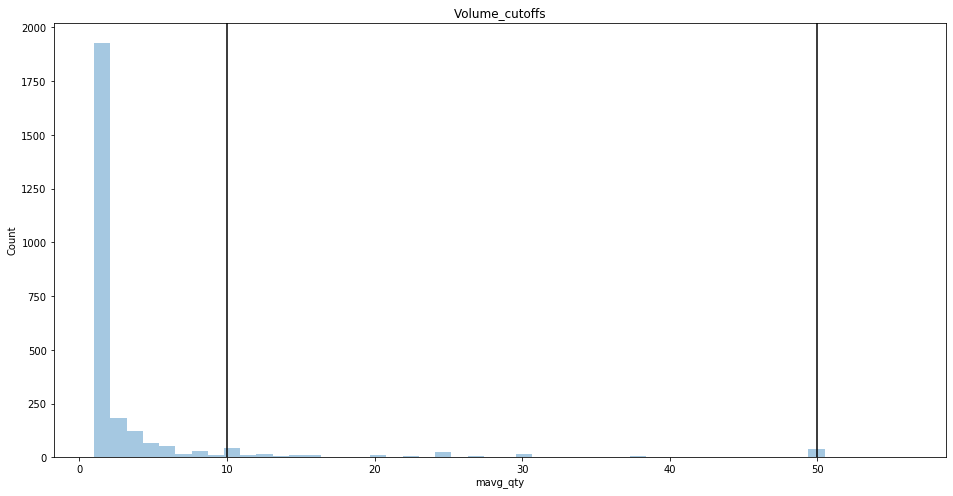

In [122]:
q = mavg_qty_freq[mavg_qty_freq['mavg_qty']<60]
plt.figure(figsize=(16,8))
sns.distplot(q['mavg_qty'],kde=False)
plt.axvline(x=10,alpha=1,color='black')
plt.axvline(x=50,alpha=1,color='black')
plt.ylabel('Count')
plt.title("Volume_cutoffs")
plt.savefig("analysis_plots/" + "Volume_cutoffs.png", format="PNG")  

In [36]:
mavg_qty_freq['Freq'].describe()

count    2711.000000
mean        1.496411
std         5.041651
min         1.000000
25%         1.000000
50%         1.000000
75%         1.125000
max       207.912281
Name: Freq, dtype: float64

In [37]:
mavg_qty_freq['Freq'].quantile([.75,.80,.85,.90,.95,.96,.97,.98,.99])

0.75    1.125000
0.80    1.250000
0.85    1.428571
0.90    1.678571
0.95    2.571667
0.96    2.962281
0.97    3.675000
0.98    5.245614
0.99    9.800000
Name: Freq, dtype: float64

In [38]:
#cutoffs for low, medium,high volume are 0-1.67,1.67-5,5-max 

In [39]:
low_frequency = mavg_qty_freq[mavg_qty_freq['Freq']<1.67]['MaterialNumber_MARC'].tolist()

In [40]:
medium_frequency = mavg_qty_freq[(mavg_qty_freq['Freq']>=1.67) & (mavg_qty_freq['Freq']<=5)]['MaterialNumber_MARC'].tolist()

In [41]:
high_frequency = mavg_qty_freq[mavg_qty_freq['Freq']>5]['MaterialNumber_MARC'].tolist()

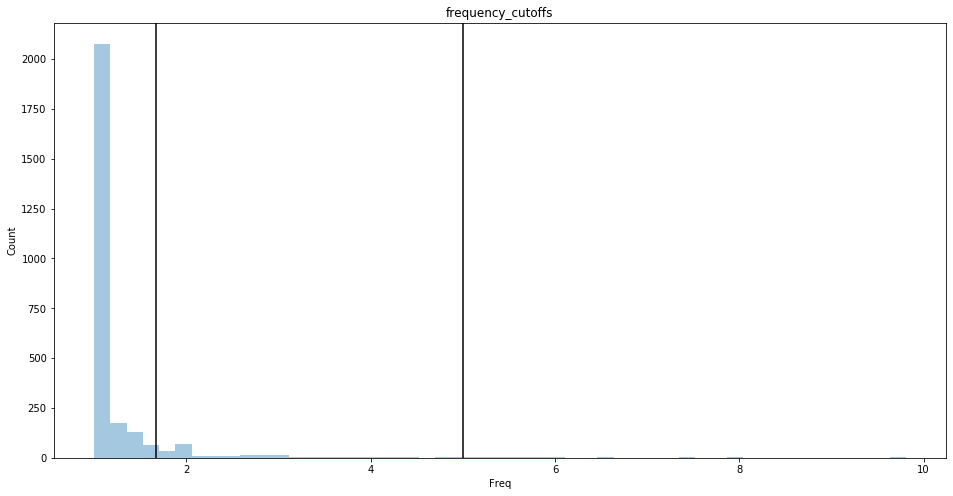

In [120]:
f = mavg_qty_freq[mavg_qty_freq['Freq']<10]
plt.figure(figsize=(16,8))
sns.distplot(f['Freq'],kde=False)

plt.axvline(x=1.67,alpha=1,color='black')
plt.axvline(x=5,alpha=1,color='black')

plt.ylabel('Count')
plt.title("frequency_cutoffs")
plt.savefig("analysis_plots/" + "frequency_cutoffs.png", format="PNG")  

# Time Series

In [43]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import numpy as np
import pandas as pd
import datetime
import numpy as np
import pandas as pd
import datetime
from math import sqrt
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
import statsmodels.api as sm

In [44]:
data = pd.read_csv("Invmovements.csv",sep = ",")

In [45]:
data.head()

,Plant,PostingDate,StorageLocation,MaterialDocument,MaterialDocumentItem,MaterialNumber_MARC,MaterialDescription,MovementType,MovementTypeText,DebitCreditInd,Quantity_SUM,MaterialDocument_COUNT
0,C002,20140605,30,5000013315,1,150000013,CHANGER 5 TUBE-FR,101,GR goods receipt,S,37.0,1
1,C002,20140702,30,5000014438,1,150034849,DECK REFRIG ROYAL ECONO COOL-NFR,101,GR goods receipt,S,6.0,1
2,C002,20140711,30,4900171660,1,150000013,CHANGER 5 TUBE-FR,641,TF to stck in trans.,H,20.0,1
3,C002,20140722,30,5000015178,1,150000017,VALIDATOR MARS 2000 SERIES 24 V-FR,101,GR goods receipt,S,37.0,1
4,C002,20140818,30,5000016383,1,150034851,DECK REFRIG DN800-NFR,101,GR goods receipt,S,2.0,1


In [46]:
df_mov = data[data["Plant"] == "C004"]
df_mov.shape

(136844, 12)

In [47]:
df_mov = df_mov[df_mov.MovementType.isin([261])]

In [48]:
df_mov.rename(columns = {"MaterialNumber_MARC": "MaterialNumber"}, 
                                 inplace = True) 
df_mov  = df_mov[["PostingDate","StorageLocation","MaterialNumber","MovementType","DebitCreditInd","Quantity_SUM"]]

df_mov.shape

(73223, 6)

In [49]:
grp_mov = df_mov.groupby(["MaterialNumber","MovementType","PostingDate"]).sum()

In [50]:
grp_mov = grp_mov.reset_index()

In [51]:
grp_mov.PostingDate = grp_mov.PostingDate.apply(lambda x : pd.to_datetime(x,format = '%Y%m%d', errors='ignore'))

In [52]:
grp_mov = grp_mov.sort_values(by = 'PostingDate')
del grp_mov["StorageLocation"]
grp_mov.head()

,MaterialNumber,MovementType,PostingDate,Quantity_SUM
19871,150026497,261,2014-10-25,12.0
13074,150017509,261,2014-10-25,1.0
34639,150032545,261,2014-10-25,1.0
41656,150033644,261,2014-10-25,1.0
36586,150033199,261,2014-10-25,2.0


In [53]:
del grp_mov["MovementType"]
grp_mov.head()

,MaterialNumber,PostingDate,Quantity_SUM
19871,150026497,2014-10-25,12.0
13074,150017509,2014-10-25,1.0
34639,150032545,2014-10-25,1.0
41656,150033644,2014-10-25,1.0
36586,150033199,2014-10-25,2.0


In [55]:
grp_mov.shape

(47853, 3)

In [56]:
##n_series to find the individual series for a kunag,matnr combination
def n_series(input_df,matnr): 
    df = input_df.copy()
#     print(df.head())
#     print("matnr :",matnr)
    n_df1 = df[(df["MaterialNumber"] == matnr)]
#     print(n_df1.head())

    #sort date start to end
    n_df1 = n_df1.sort_values('PostingDate')
    n_df1.set_index('PostingDate',inplace=True)
#     print(n_df1.head())

    #sampling the data on weekly basis (index is set to date first in the above step to do weekly sampling
    weekly_resampled_data = n_df1.Quantity_SUM.resample('M').sum() 
    weekly_resampled_data = weekly_resampled_data.replace(np.nan, 0)
    individual_series = weekly_resampled_data.to_frame()     
    #resetting index so that date can be used as column
    individual_series = individual_series.reset_index()
    return individual_series

#splitting the individual series basesd on the number of weeks (i, is for dyanamic point forecasts)
def train_test_split(input_df,matnr,i):
    data= n_series(input_df,matnr)
    train = data.iloc[0:-i]    
    test = data.iloc[-i:]
    return train,test

In [169]:
def moving_average(input_df,matnr,n,roll):

    index = str(matnr)
    i = 0
    lst = []
    test1 = train_test_split(input_df,matnr,n)[1]
#     y_hat = test1.copy()
    y_hat_avg = test1.copy()

    for i in range(n,0,-1):
        train,test = train_test_split(input_df,matnr,i)
        dd= np.asarray(train["Quantity_SUM"])
        y_hat_avg['moving_avg_forecast'] = train['Quantity_SUM'].rolling(roll).mean().iloc[-1]
        pred = y_hat_avg['moving_avg_forecast']
        lst.append(pred.iloc[-1])

    pd.DataFrame(lst)
    y_hat_avg['pred_column']=lst
    plt.figure(figsize=(12,8))
    plt.plot( train.set_index("PostingDate")['Quantity_SUM'], label='Train',marker = '.')
    plt.plot(test1.set_index("PostingDate")['Quantity_SUM'], label='Test',marker = '.')
    plt.plot(y_hat_avg.set_index("PostingDate")['pred_column'], label='moving_avg_forecast',marker = '.')
    plt.legend(loc='best')
    plt.title(str(matnr)+"_moving_avg_forecast")
    plt.savefig( "plots_ma12/" + 'Graph_{}.png'.format(index), format="PNG")  

#     plt.show()
    rms = sqrt(mean_squared_error(test1.Quantity_SUM, y_hat_avg.pred_column))
    mae = mean_absolute_error(test1.Quantity_SUM, y_hat_avg.pred_column)
    del y_hat_avg['moving_avg_forecast']
    return y_hat_avg,rms,mae


In [163]:
def arima(input_df,matnr,n,p,d,q):

    index =str(matnr)
    i = 0
    lst = []
    test1 = train_test_split(input_df,matnr,n)[1]
    y_hat_avg = test1.copy()
    start_date = str(test1["PostingDate"][:1])
    end_date = str(test1["PostingDate"][-1:])
    order = (p, d,q)
    for i in range(n,0,-1):
        train,test = train_test_split(input_df,matnr,i)
        dd= np.asarray(train["Quantity_SUM"])
        fit1 = sm.tsa.statespace.SARIMAX(train["Quantity_SUM"], order=order,enforce_stationarity = False, enforce_invertibility = False,trend = "n").fit()    
        pred = fit1.predict(1)
        lst.append(pred.iloc[-1])

    pd.DataFrame(lst)
    y_hat_avg['pred_column']=lst
    plt.figure(figsize=(12,8))
    plt.plot( train.set_index("PostingDate")['Quantity_SUM'], label='Train',marker = '.')
    plt.plot(test1.set_index("PostingDate")['Quantity_SUM'], label='Test',marker = '.')
    plt.plot(y_hat_avg.set_index("PostingDate")['pred_column'], label='ARIMA' + "_" + str(order),marker = '.')
    plt.legend(loc='best')
    plt.title(str(matnr)+"_ARIMA")

    plt.savefig("plots_arima12/" + 'Graph_{}.png'.format(index), format="PNG")  

#     plt.show()
    rms = sqrt(mean_squared_error(test1.Quantity_SUM, y_hat_avg.pred_column))
    mae = mean_absolute_error(test1.Quantity_SUM, y_hat_avg.pred_column)
    return y_hat_avg,rms,mae


In [172]:
#Simple Exponential Smoothing
def ses(input_df,matnr,n,alpha):

    index =  str(matnr)
    i = 0
    lst = []
    test1 = train_test_split(input_df,matnr,n)[1]
    y_hat_avg = test1.copy()
    for i in range(n,0,-1):
        train,test = train_test_split(input_df,matnr,i)
        dd= np.asarray(train["Quantity_SUM"])
        fit2 = SimpleExpSmoothing(np.asarray(train['Quantity_SUM'])).fit(smoothing_level=alpha,optimized=False)
        y_hat_avg['SES'] = fit2.forecast(len(test1))
        pred = y_hat_avg['SES']
        lst.append(pred.iloc[-1])

    pd.DataFrame(lst)
    y_hat_avg['pred_column']=lst
    plt.figure(figsize=(12,8))
    plt.plot( train.set_index("PostingDate")['Quantity_SUM'], label='Train')
    plt.plot(test1.set_index("PostingDate")['Quantity_SUM'], label='Test')
    plt.plot(y_hat_avg.set_index("PostingDate")['pred_column'], label='SES',marker = ".")
    plt.legend(loc='best')
    plt.title(str(matnr)+"_SES")
    plt.savefig("plots_ses12/" + 'Graph_{}.png'.format(index), format="PNG")  

#     plt.show()
    rms = sqrt(mean_squared_error(test1.Quantity_SUM, y_hat_avg.pred_column))
    mae = mean_absolute_error(test1.Quantity_SUM, y_hat_avg.pred_column)
    del y_hat_avg['SES']
    return y_hat_avg,rms,mae


In [170]:
len(low_frequency)

2439

In [167]:
len(medium_frequency)

213

In [160]:
len(high_frequency)

59

In [104]:
# moving_average(grp_mov,150000005,4,4)

# Low Frequency Data

index :  150000005
index :  150000009
moving_average : 2.9518708756764185
index :  150000010
index :  150000011
moving_average : 1.2624381172952597
index :  150000016
moving_average : 0.5
index :  150000018
moving_average : 0.5863019699779287
index :  150000026
moving_average : 0.4330127018922193
index :  150000027
moving_average : 0.28867513459481287
index :  150000028
index :  150000033
index :  150000034
moving_average : 1.0282468899377555
index :  150000036
index :  150000037
index :  150000038
moving_average : 0.3227486121839514
index :  150000049
moving_average : 0.28867513459481287
index :  150000051
moving_average : 0.6692657668420421
index :  150000056
moving_average : 0.3227486121839514
index :  150000113
index :  150000177
moving_average : 0.7107800878846658
index :  150000197
index :  150000227
index :  150000253
moving_average : 1.1636866703140785
index :  150000270
moving_average : 3.8188130791298667
index :  150000278
index :  150000288
index :  150000310
index :  150000

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


moving_average : 0.4841229182759271
index :  150000677


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


moving_average : 0.28867513459481287
index :  150000718


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


moving_average : 0.28867513459481287
index :  150000720


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


moving_average : 0.28867513459481287
index :  150000744
index :  150000751


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


moving_average : 0.7671646933134153
index :  150000776
index :  150000867


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


moving_average : 2.886751345948129


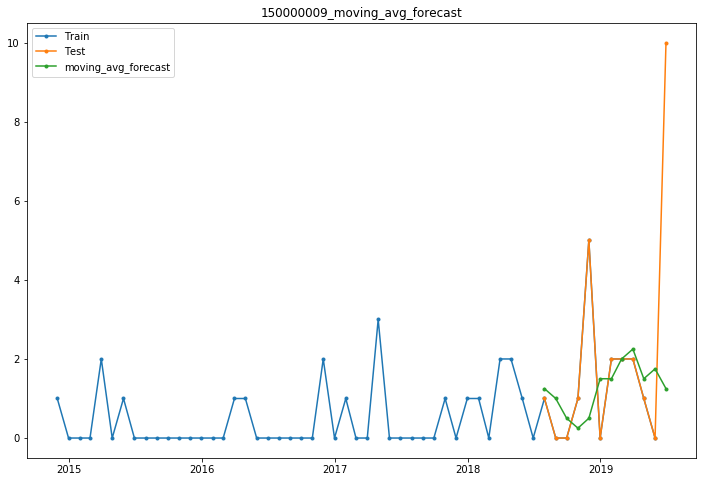

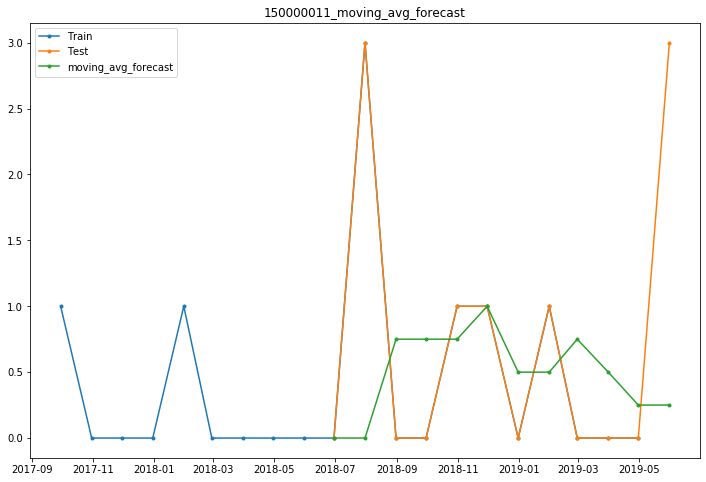

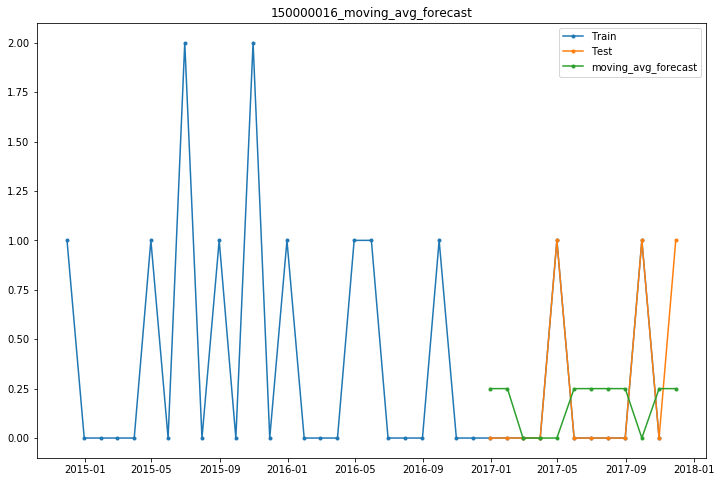

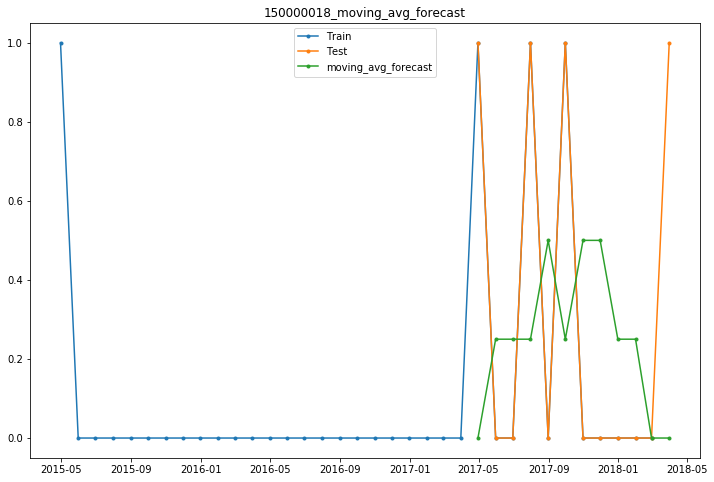

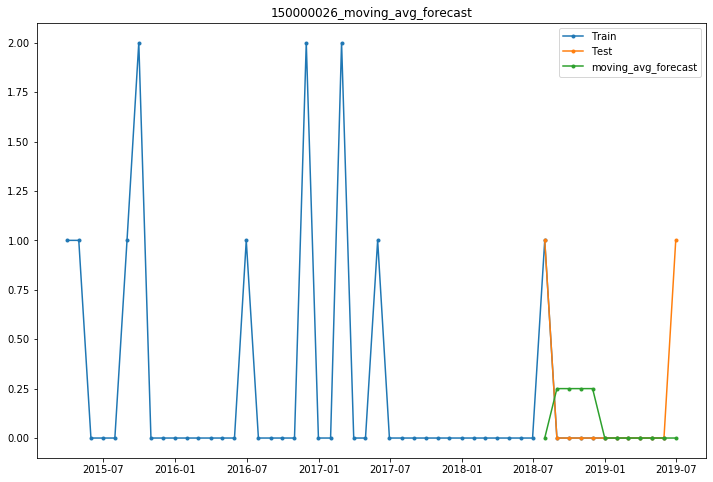

...

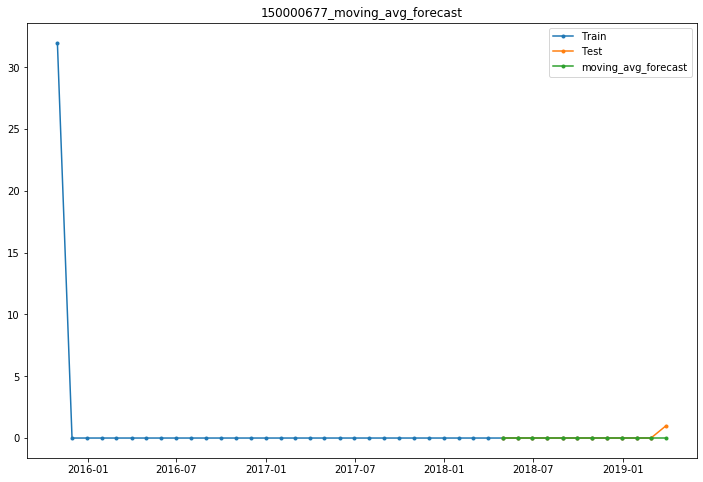

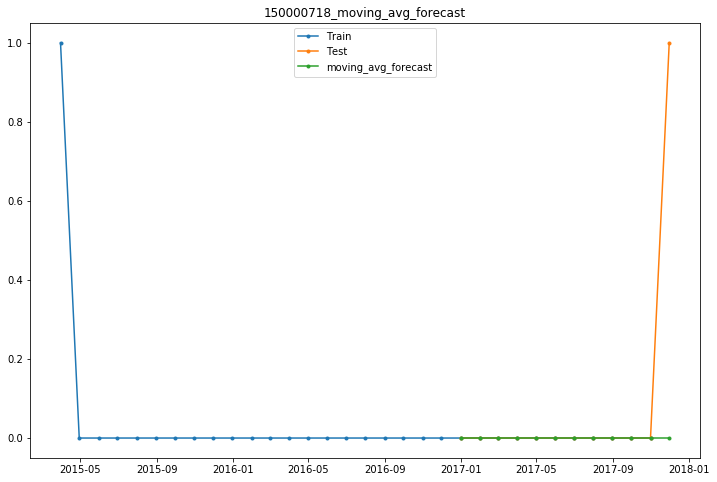

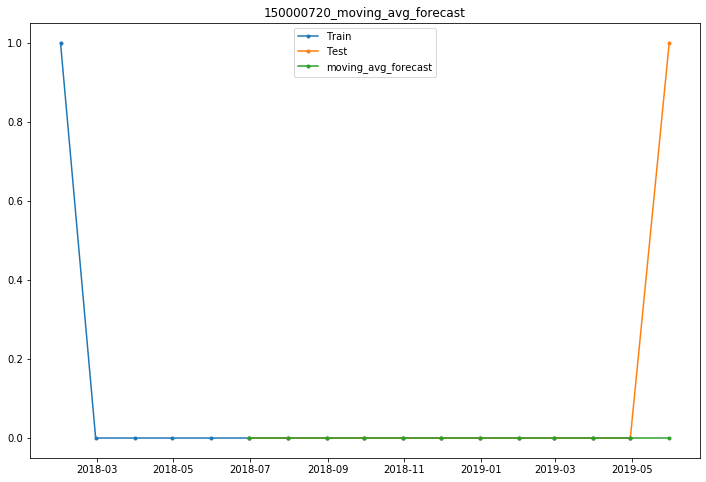

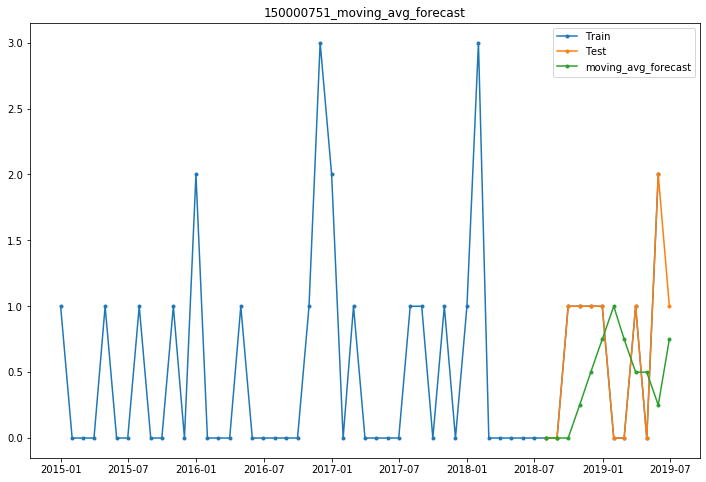

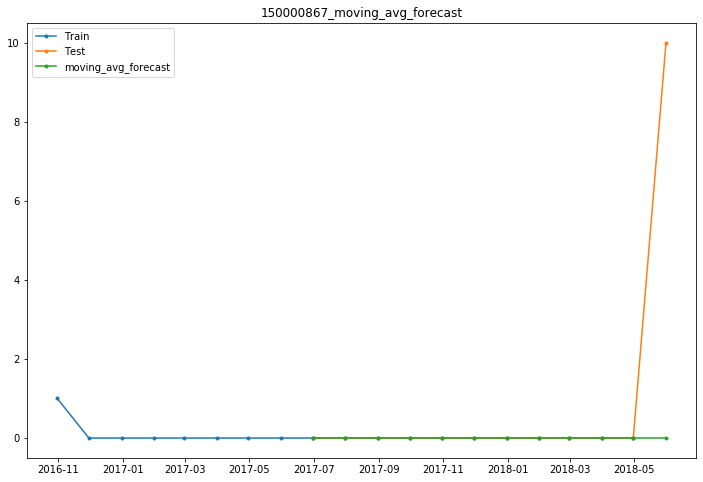

In [171]:
for i in range (0,50):
            try:
                matnr = low_frequency[i]
                print("index : ",matnr)
                output,rms,mae = moving_average(grp_mov,matnr,12,4)
                print("moving_average :",rms)
            except :
                pass

# Medium Frequency Data

index :  150000006
arimas : 0.8723149679599493
index :  150000007
arimas : 0.6412583276509124
index :  150000015
arimas : 1.6508852729342793
index :  150000052
index :  150000055
arimas : 1.3077130435630084
index :  150000156
index :  150000174
index :  150000325
arimas : 1.589707553942521
index :  150000504
arimas : 2.3165608034633856
index :  150001045
index :  150001284
arimas : 1.7201281714941155
index :  150001620
index :  150002555
arimas : 0.598742806820552
index :  150002573
arimas : 3.7941166352653495
index :  150003220
arimas : 4.772827683951249
index :  150003657
index :  150004017
arimas : 1.9724180696539102
index :  150004235
arimas : 2.416836142446341
index :  150004241
arimas : 6.212791802635889
index :  150004400
index :  150004464
index :  150004529
index :  150004713
arimas : 7.99933484972406
index :  150004715
arimas : 2.951184790941536
index :  150004721
index :  150004866
arimas : 1.2332161620516586
index :  150004924
arimas : 1.503893251386722
index :  150005008
a

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arimas : 1.3247312303603354
index :  150007123


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arimas : 2.651378153361085
index :  150007880


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arimas : 16.48047789952615
index :  150008092
index :  150008164


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arimas : 2.0675011622030524
index :  150008325


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arimas : 1.0330268097802562
index :  150008374


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arimas : 175.57399884219072
index :  150008421


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arimas : 0.9624576972301574
index :  150008489


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arimas : 1.8172318136935566
index :  150008492


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arimas : 1.5499714458470142
index :  150008508


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arimas : 0.2883043396996703
index :  150008695


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arimas : 1.2827198807665567
index :  150008724
index :  150009224


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arimas : 1.587486491893656
index :  150009278
index :  150009573


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arimas : 2.029745051755707
index :  150009618


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arimas : 0.5767512401834711
index :  150009771


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arimas : 1.3573587234990858
index :  150009834


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arimas : 1.539011228333887


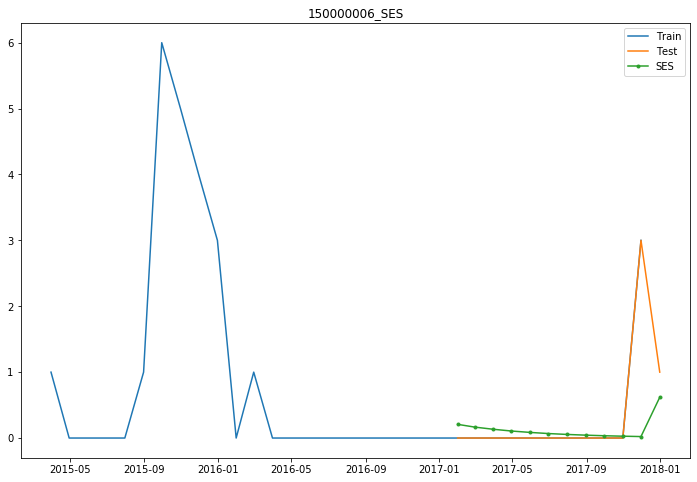

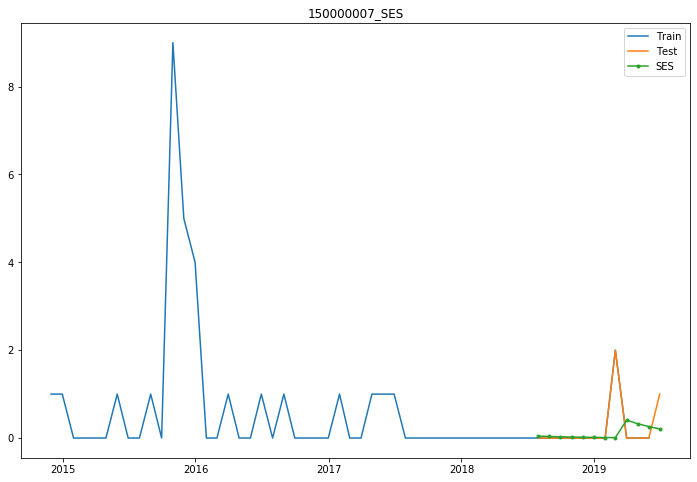

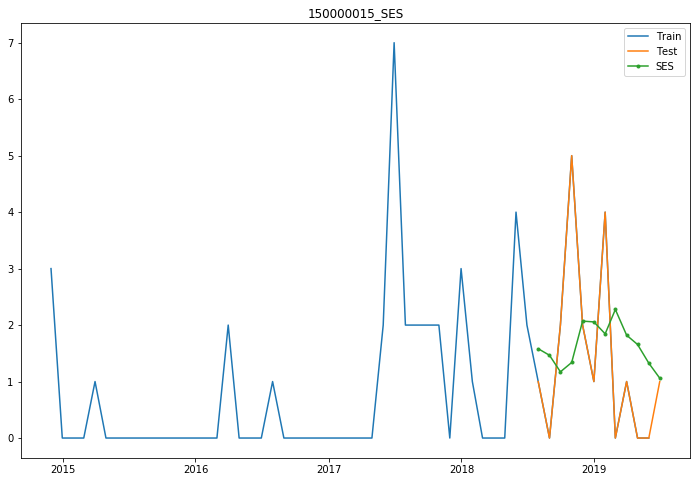

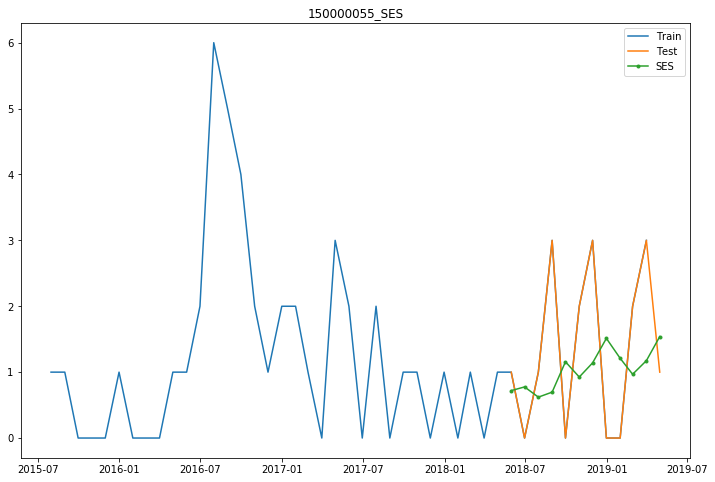

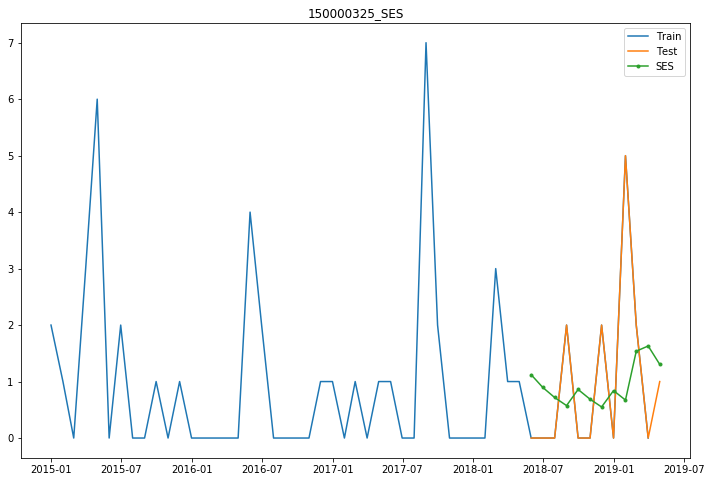

...

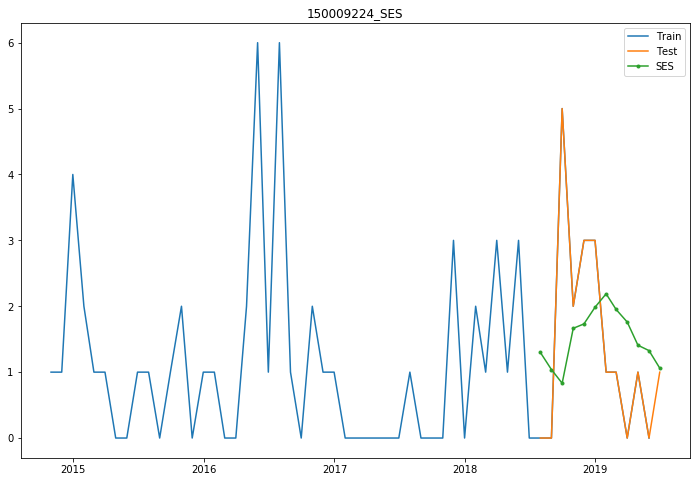

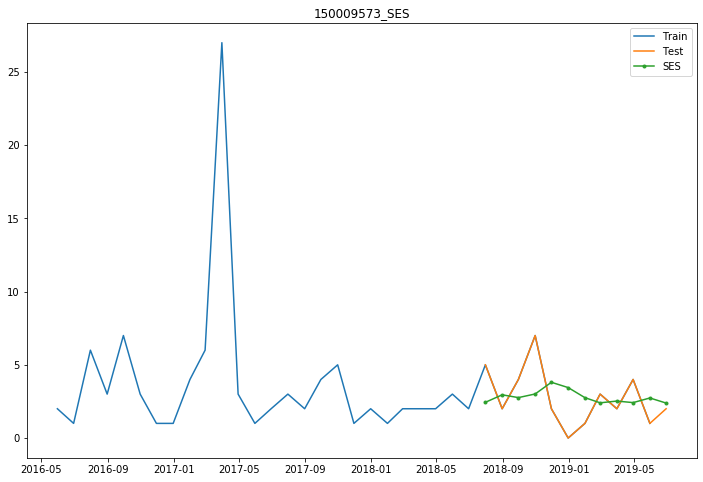

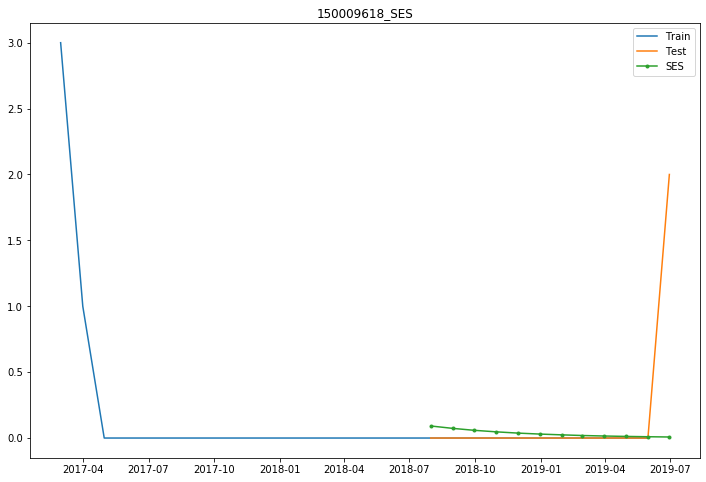

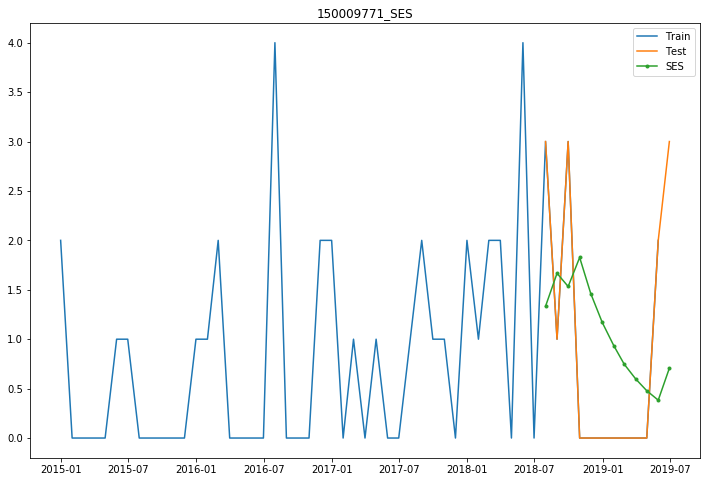

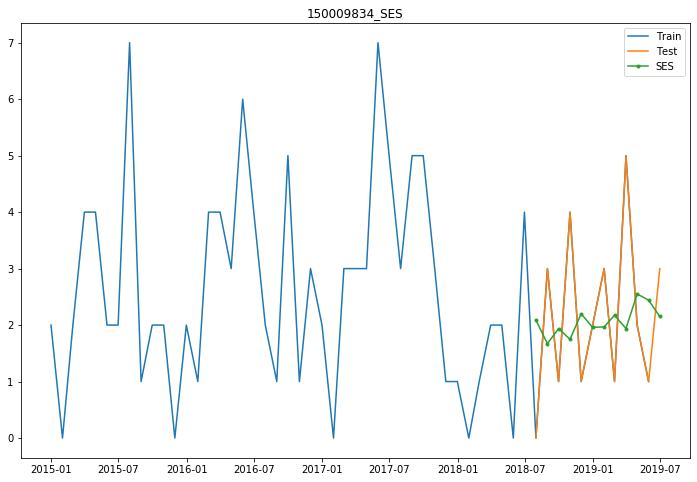

In [173]:
for i in range (0,50):
            try:
                matnr = medium_frequency[i]
                print("index : ",matnr)
                output3,rms3,mae3 = ses(grp_mov,matnr,12,0.2)
                print("arimas :",rms3)
            except :
                pass

# High Frequency Data

index :  150000013
arima : 4.518661627711225
index :  150000017
arima : 4.9593088926490205
index :  150000682
arima : 14.525123466405526
index :  150001240
arima : 10.050561042161453
index :  150002031


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", Conve

arima : 2.598076211353316
index :  150002198
arima : 3.5021115597555235
index :  150003747
arima : 8.526873334073947
index :  150004663
arima : 4.16791986844486
index :  150004720
arima : 3.946322307063442
index :  150004830
arima : 7.917202738598885
index :  150007092


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


arima : 5.085382901230925
index :  150008494
arima : 17.609183210283586
index :  150008943
arima : 142.78531890726833
index :  150009920
index :  150009982
arima : 3.1703741230590783
index :  150010079
arima : 2.2272288617751768
index :  150013771
arima : 3.8478861355199414
index :  150016868
index :  150017824
arima : 6.576323523599281
index :  150018404
arima : 5.652735383076716
index :  150019114
arima : 24.43287384673129
index :  150025684


/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", Conve

arima : 137.12068893253613
index :  150025962


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 74.2279851246695
index :  150025964
index :  150026497


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 82.60848370159516
index :  150028383


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 315.7196089880817
index :  150028459


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 344.65086120884763
index :  150028720


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 4.250335063604147
index :  150028723


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 9.200955057388049
index :  150029460


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 3.8428269725446156
index :  150030312


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 9.43614228459944
index :  150031169


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 7.501334229831296
index :  150031208


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 4.317312372507906
index :  150031532


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 4.456349460296632
index :  150031613


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 68.55615836562973
index :  150031616


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 62.95427411483227
index :  150031619


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 59.78121734932356
index :  150032015


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 5.085807537894169
index :  150032128


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 102.50522943393182
index :  150032915


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 5.288391817648673
index :  150033218


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 2.759825522816552
index :  150033387


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 165.1291609151653
index :  150033389


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 133.06761240722815
index :  150033400


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 162.37844106636902
index :  150033406


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 163.7618438632171
index :  150033541


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 101.73747301914133
index :  150033588


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 58.17264412887978
index :  150033857


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 10.424731669932454
index :  150033858


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 110.47435988394804
index :  150033919


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 105.58478444112092
index :  150034828


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 3.210758775611627
index :  150035199


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 25.683070586399396
index :  150035424


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 5.289739979261385
index :  150050823


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 53.52603866576672
index :  150059994
index :  150067335
index :  150067336


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 9.262827660406849
index :  150067344


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 11.160278953210284
index :  150067421


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


arima : 4.347076563595274


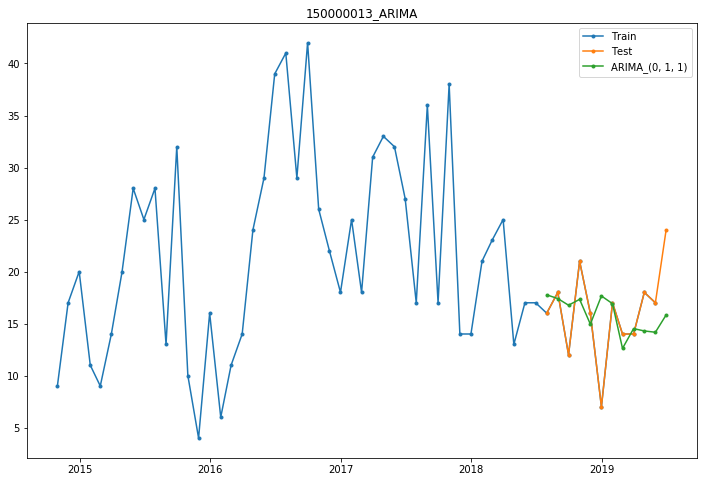

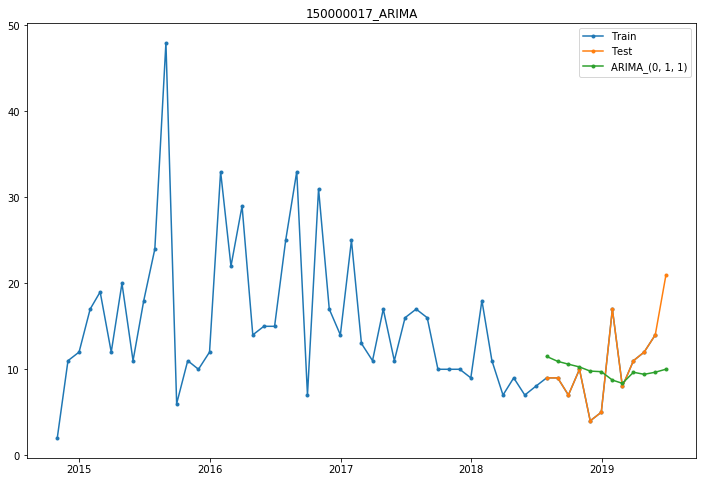

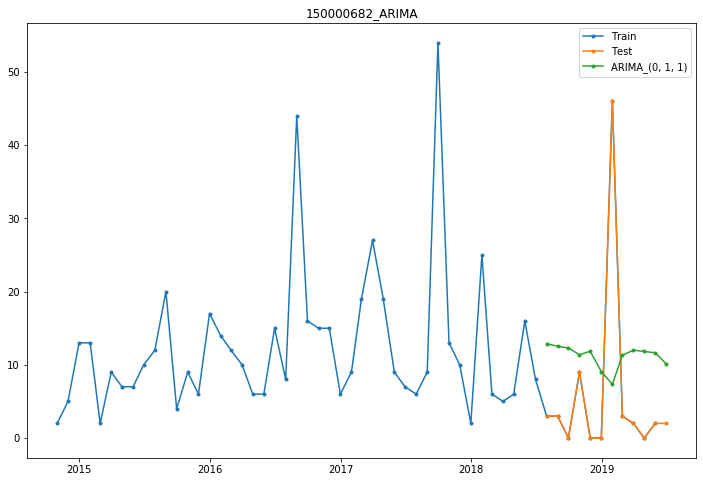

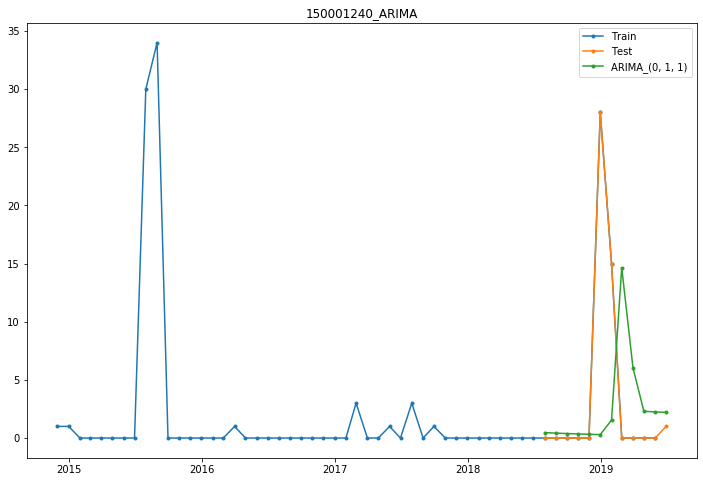

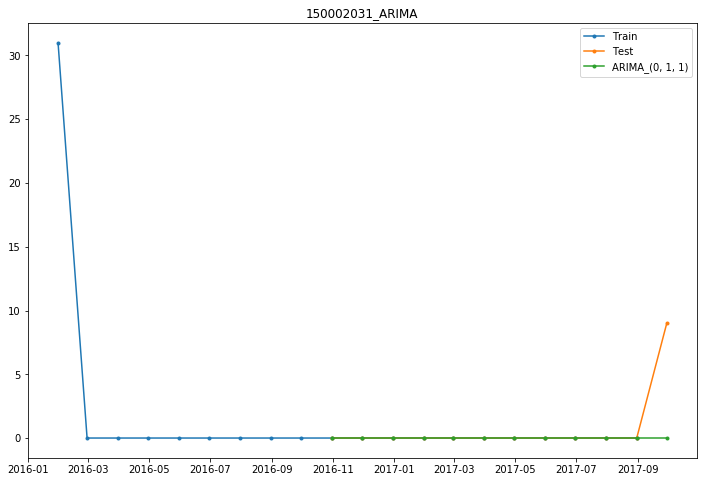

...

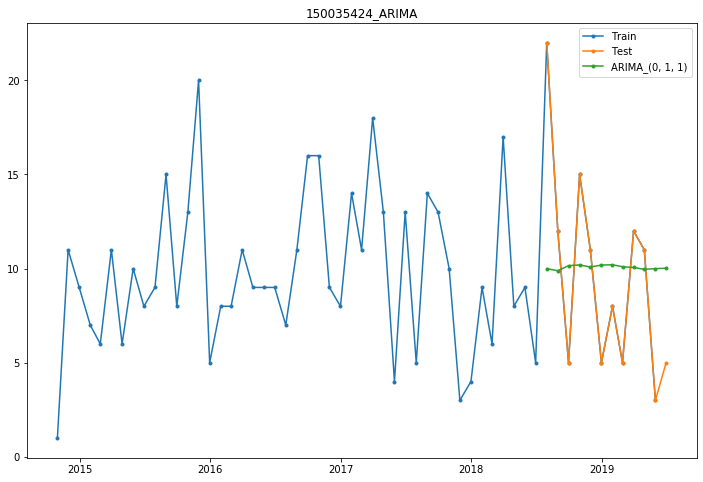

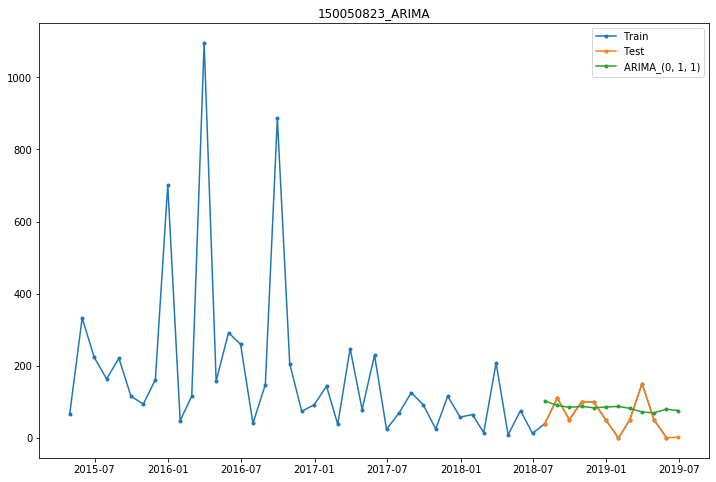

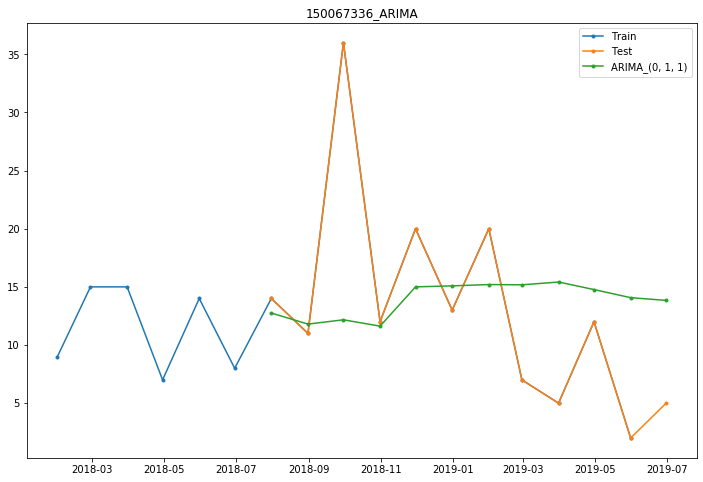

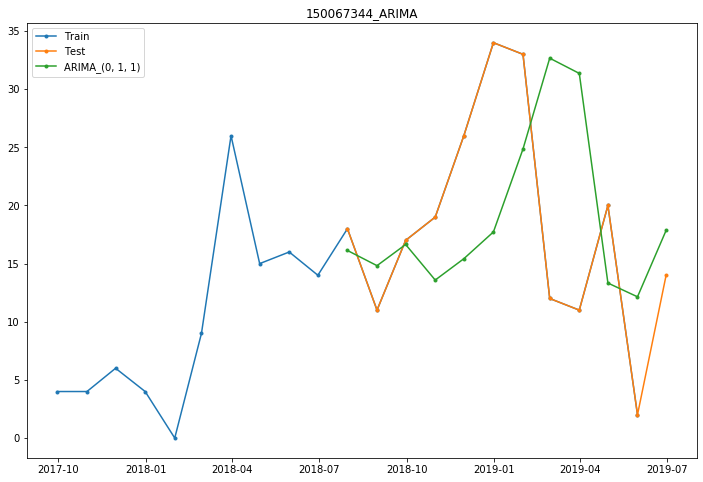

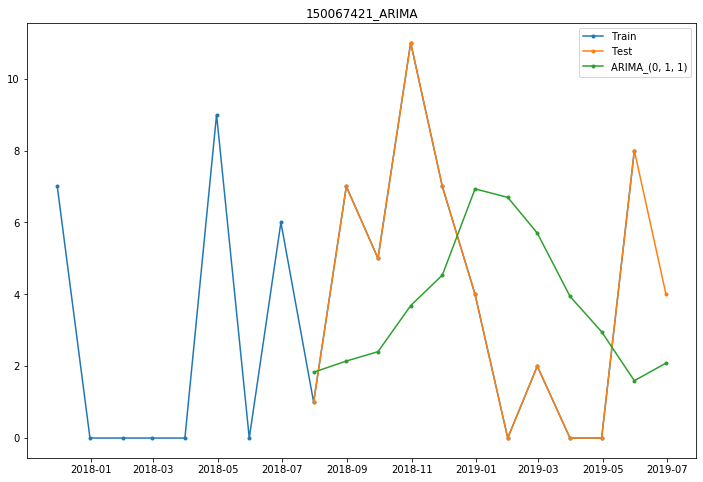

In [166]:
for i in range (0,59):
            try:
                matnr = high_frequency[i]
                print("index : ",matnr)
                output,rms,mae = arima(grp_mov,matnr,12,0,1,1)
                print("arima :",rms)
            except :
                pass

In [129]:
columns = "011","101","110","111","121","112","211"
df_res= pd.DataFrame(index=None, columns=columns)

In [130]:
df_res

,011,101,110,111,121,112,211


In [132]:
def_red =pd.DataFrame(OrderedDict({"matnr" : [matnr],
                    "011" : [round(rms1,3)],
                   "101" : [round(rms2,3)],
                   "110" : [round(rms3,3)],
                   "111" : [round(rms4,3)],
                   "211" : [round(rms5,3)],
                   "121" : [round(rms6,3)],
                   "112" : [round(rms7,3)]}))
            print(df_res)
            main_df = main_df.append(df_res, ignore_index = True) 

IndentationError: unexpected indent (<ipython-input-132-604f920cb184>, line 9)

## Eperimentations


Empty DataFrame
Columns: [011, 101, 110, 111, 121, 112, 211]
Index: []
index :  150000013


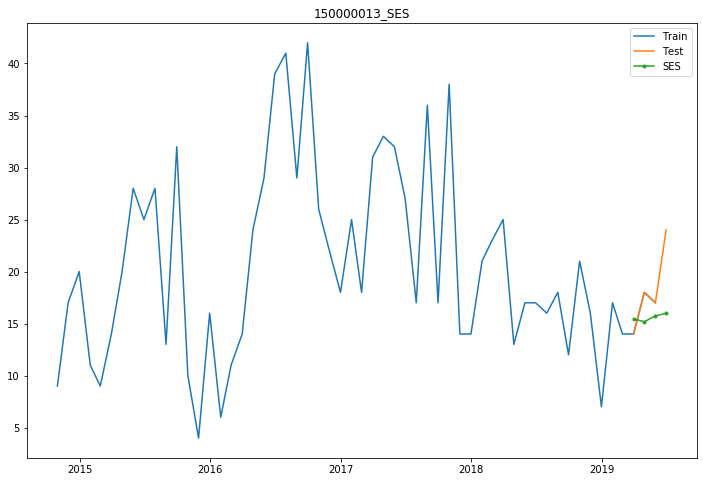

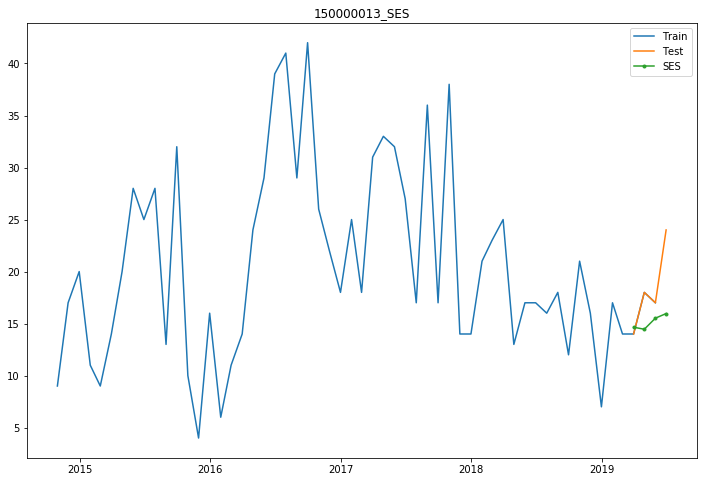

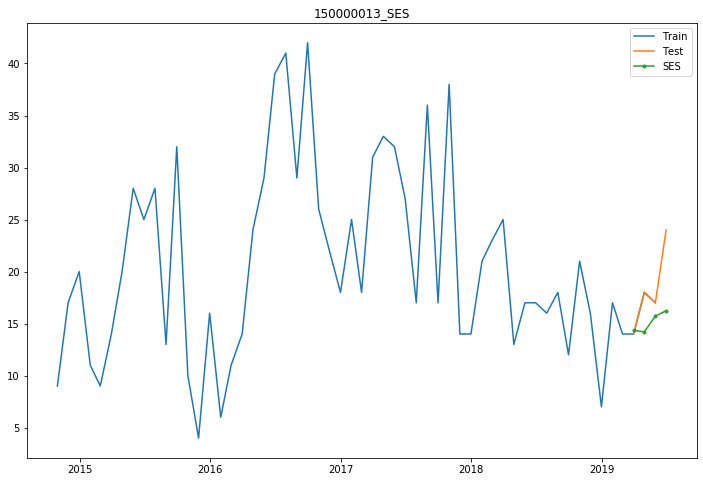

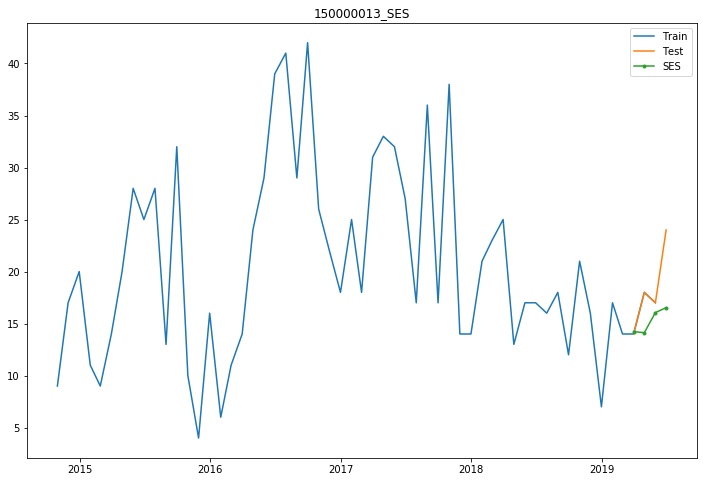

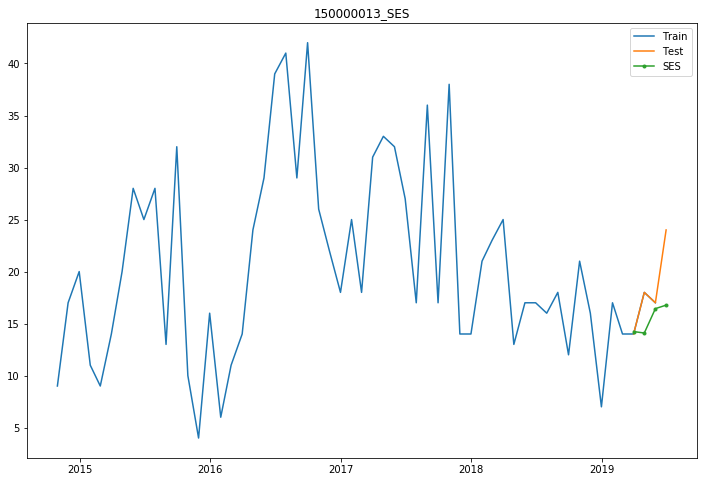

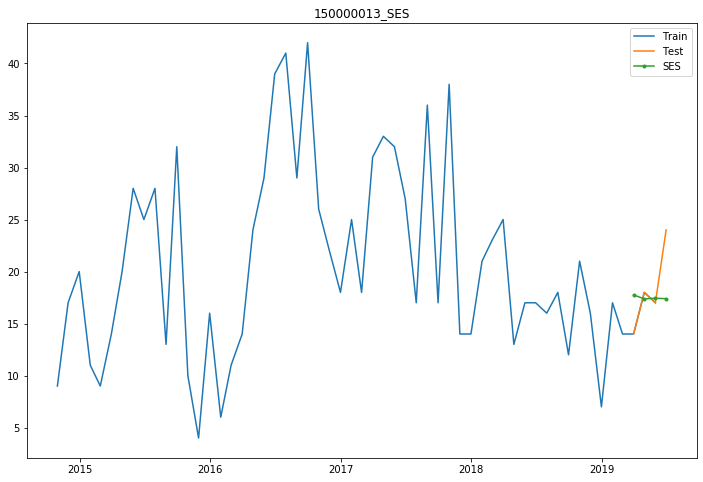

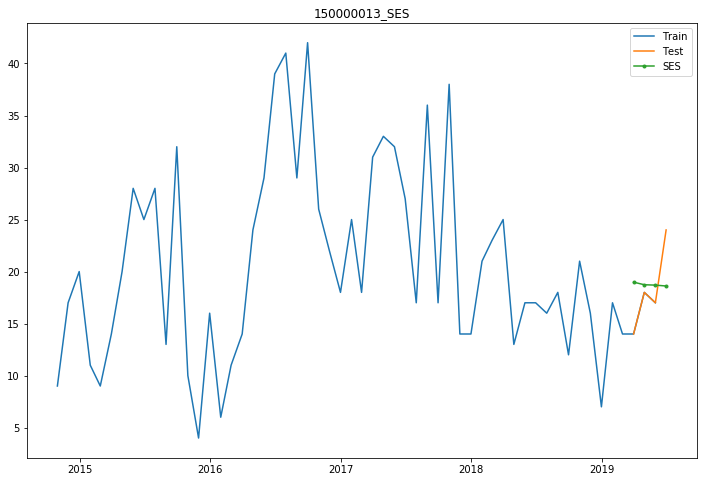

       matnr    011    101    110    111    211    121    112
0  150000013  4.354  4.465  4.372  4.237  4.118  3.817  3.784
index :  150000017


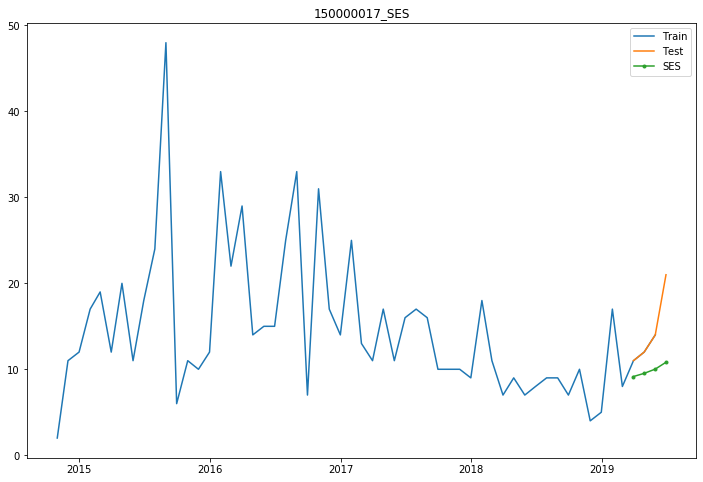

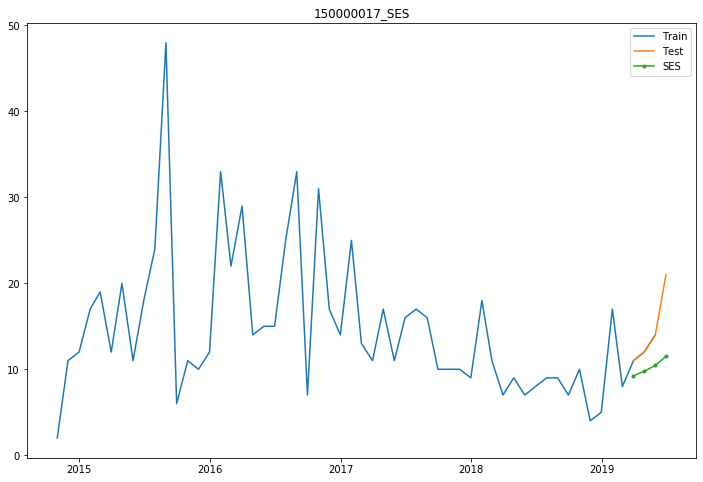

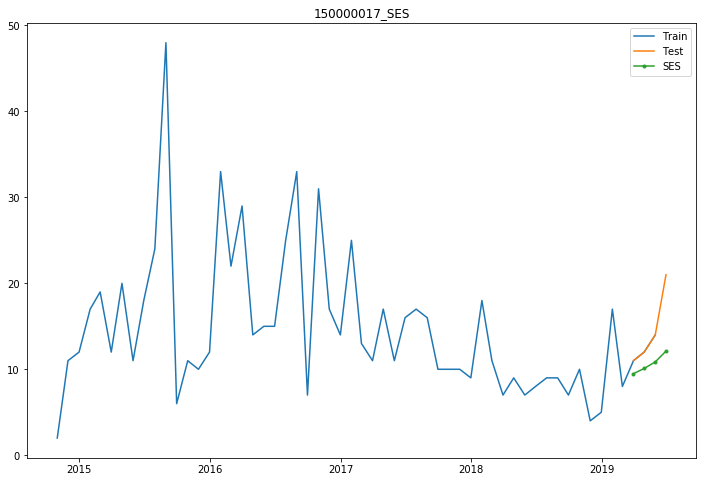

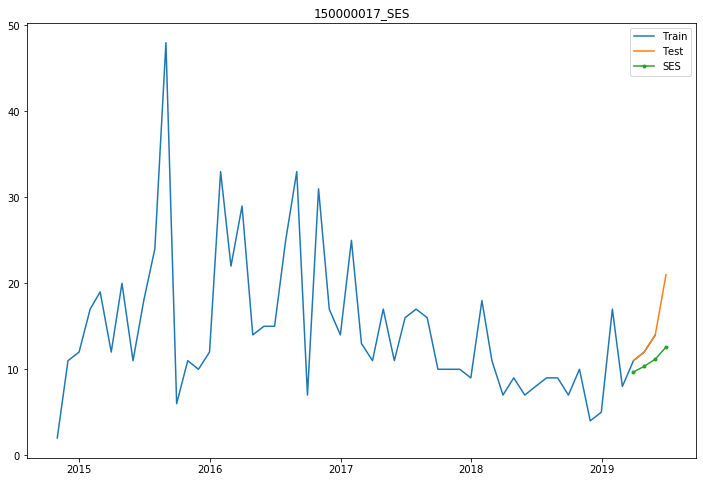

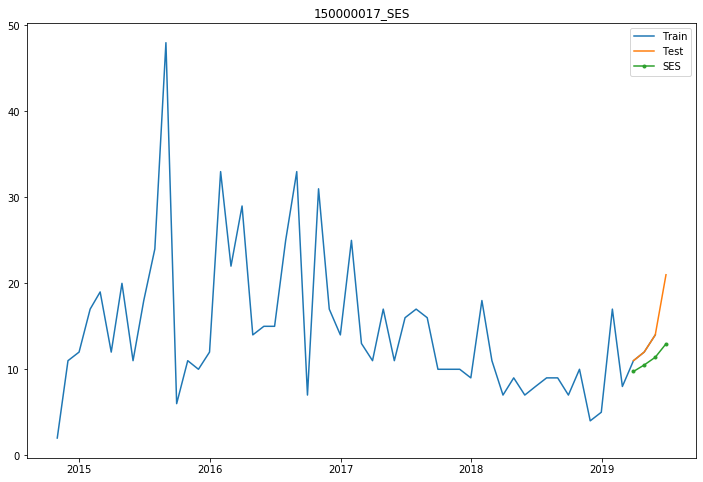

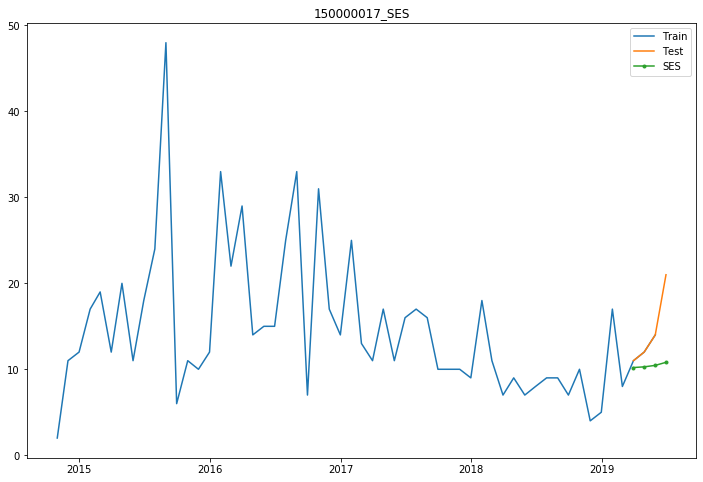

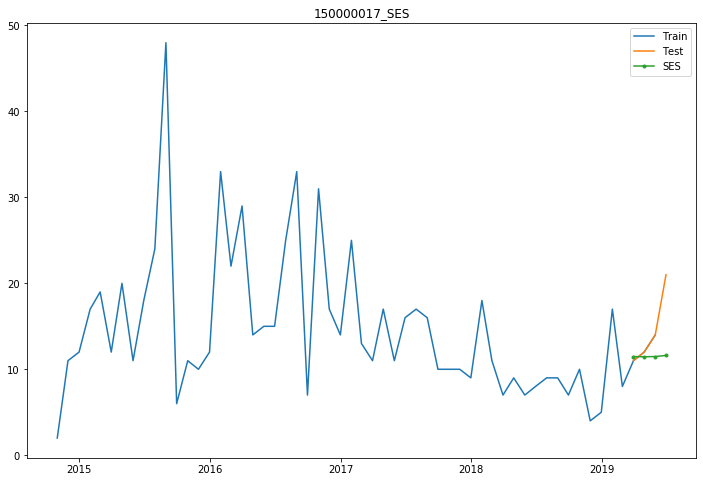

       matnr   011    101    110    111    211    121    112
0  150000017  5.68  5.264  4.867  4.563  4.337  5.478  4.875
index :  150000682


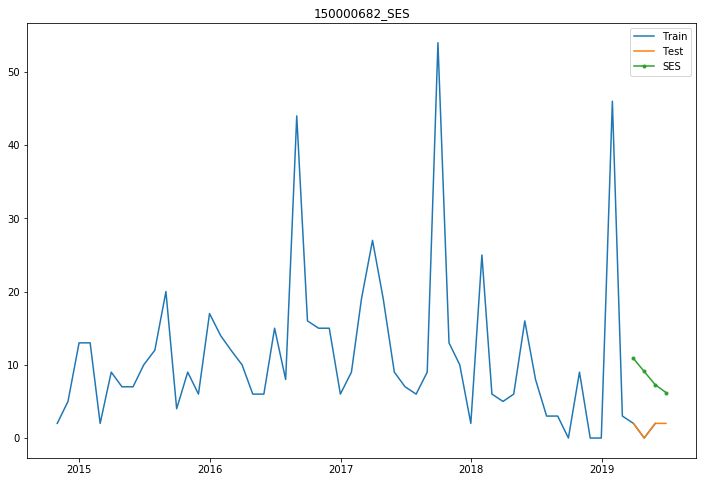

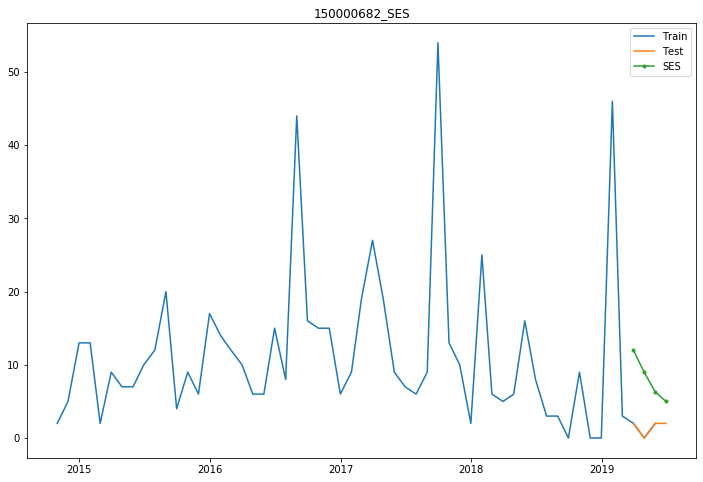

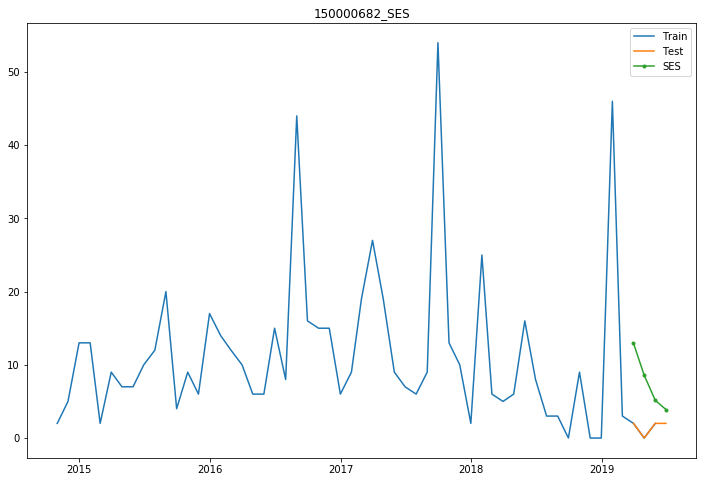

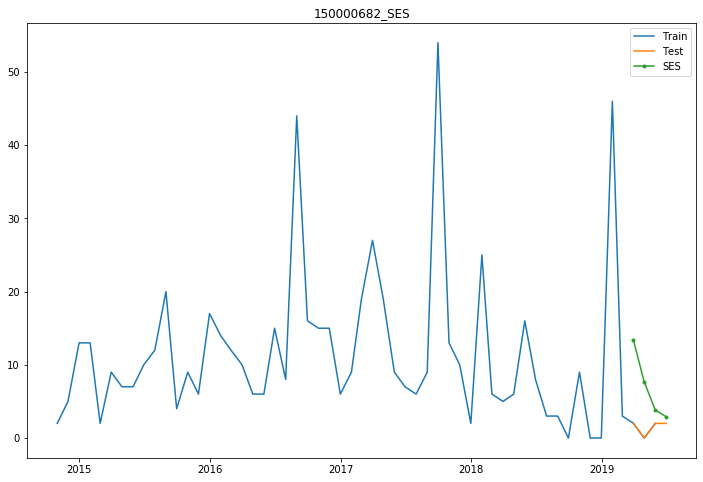

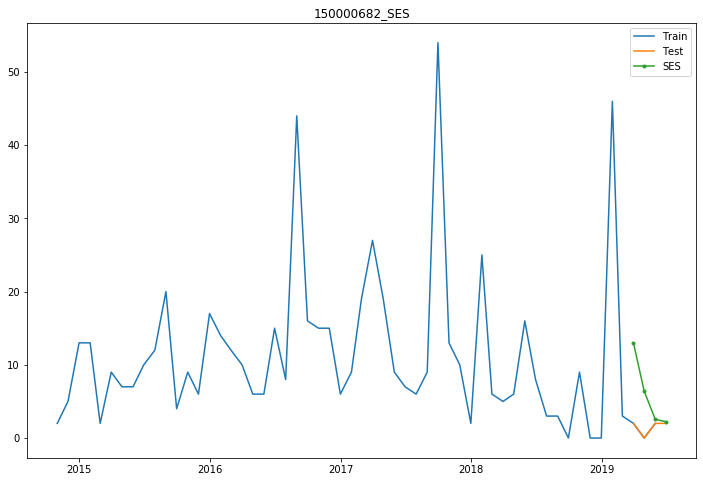

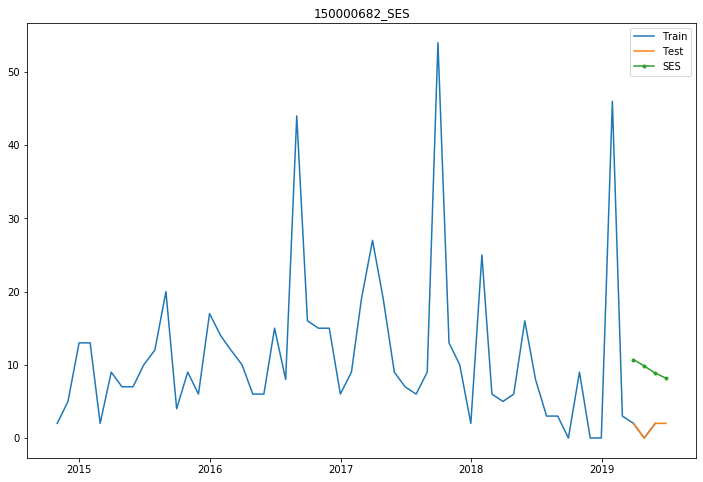

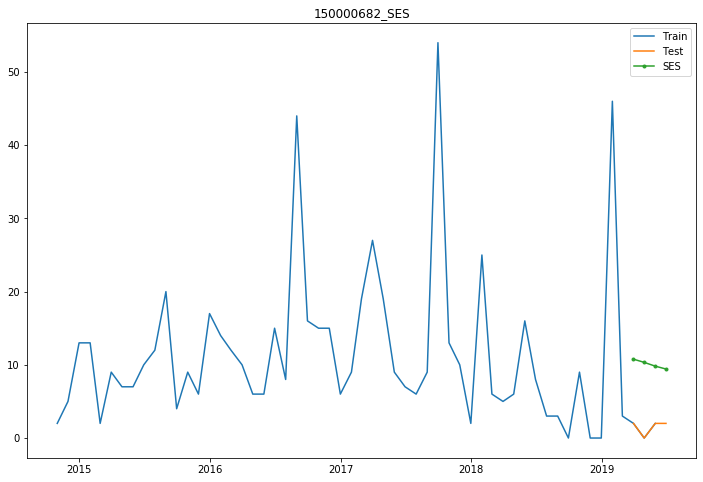

       matnr    011   101    110   111    211    121   112
0  150000682  7.191  7.21  7.198  6.93  6.368  8.034  8.66
index :  150001240


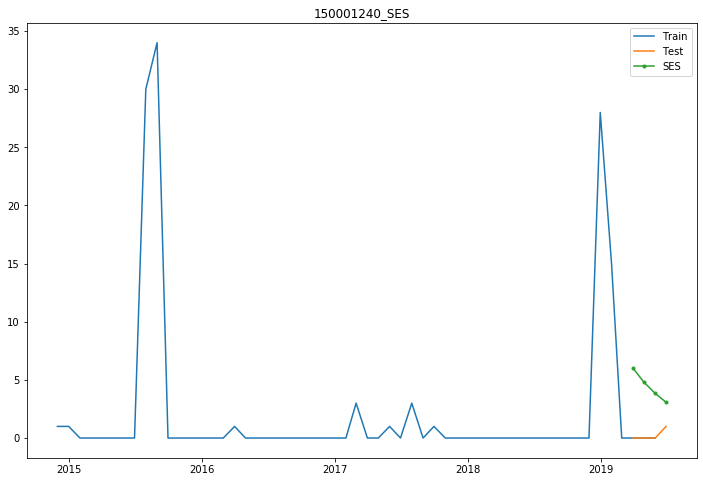

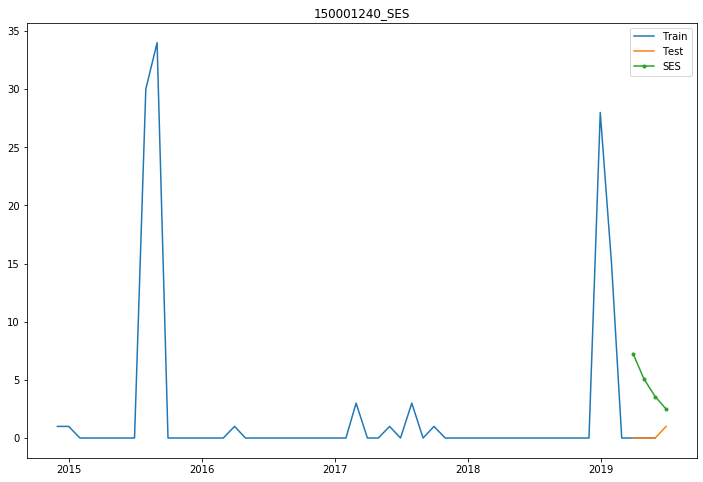

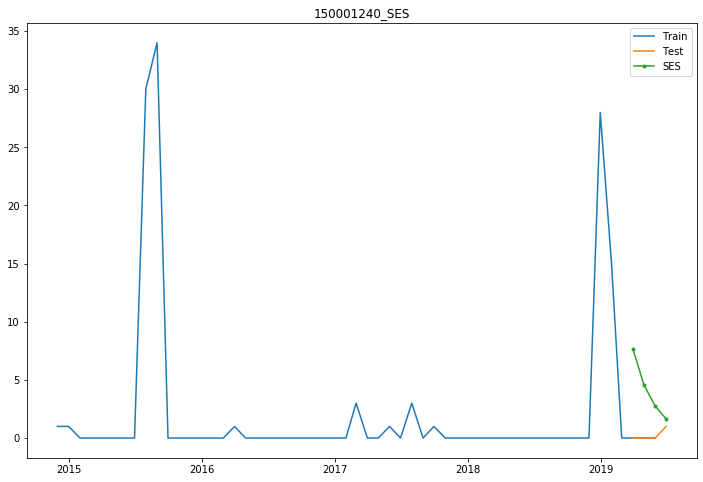

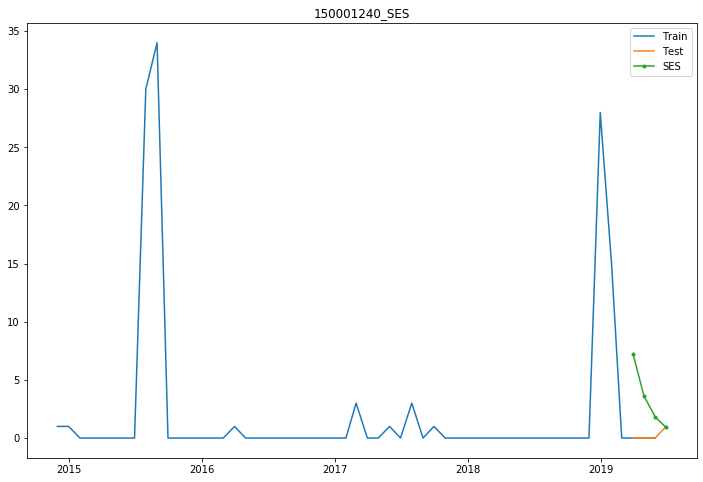

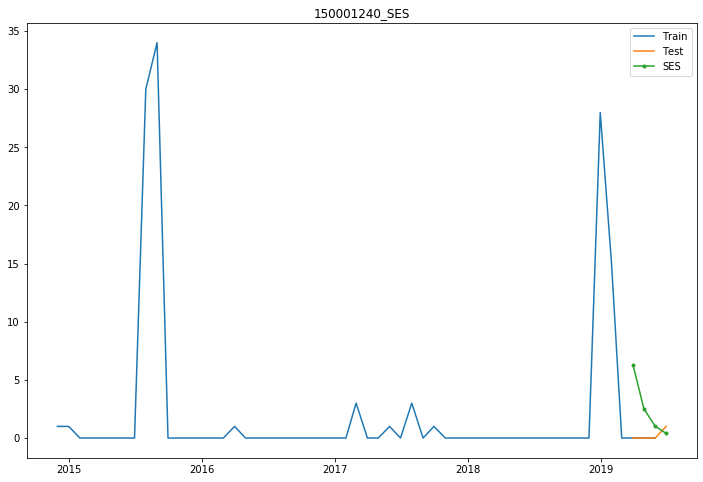

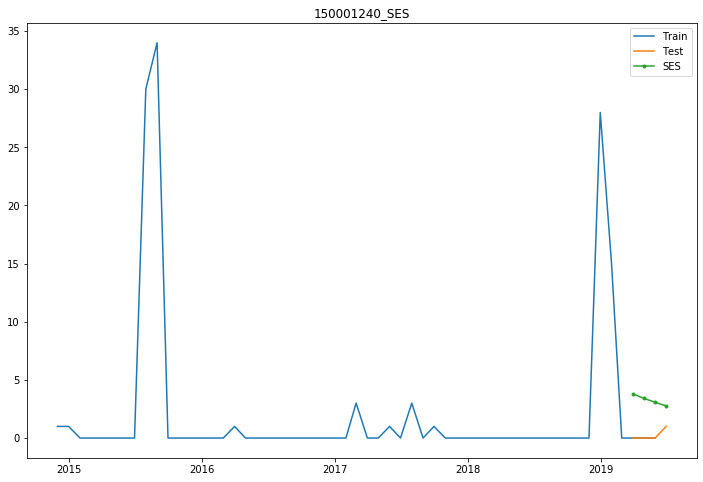

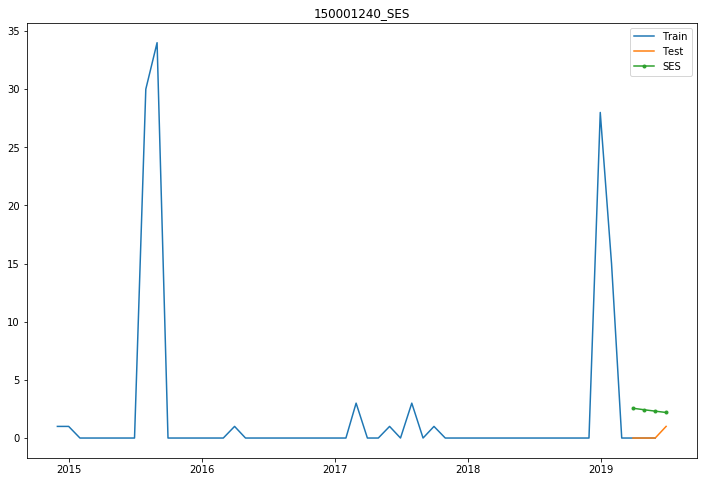

       matnr   011    101    110    111    211    121    112
0  150001240  4.42  4.838  4.669  4.153  3.436  3.104  2.195
index :  150002031


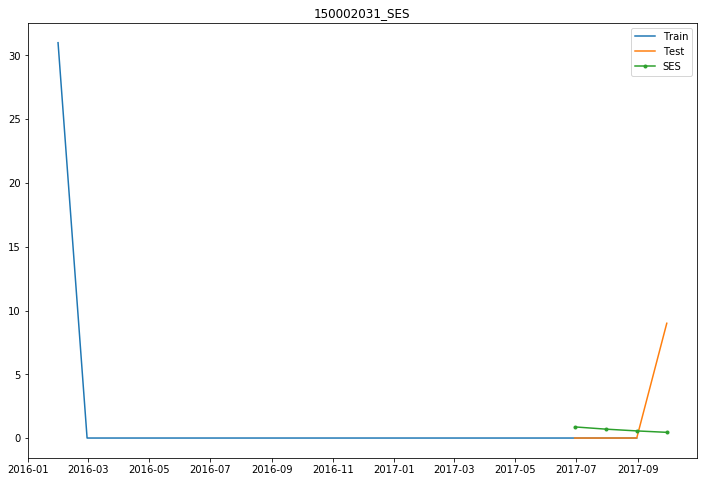

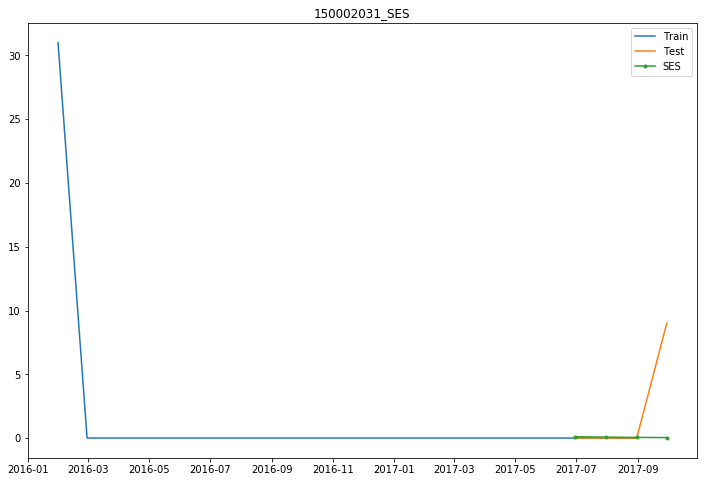

index :  150002198


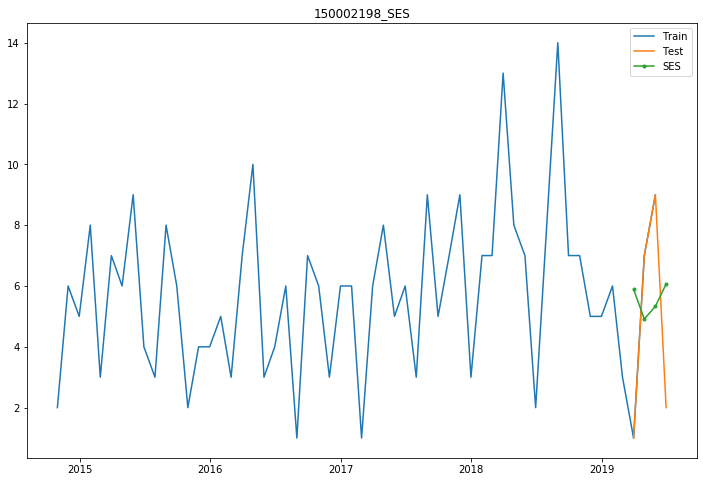

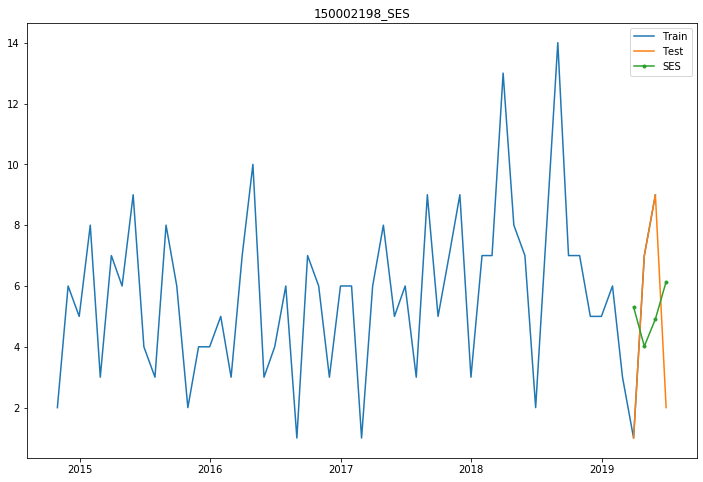

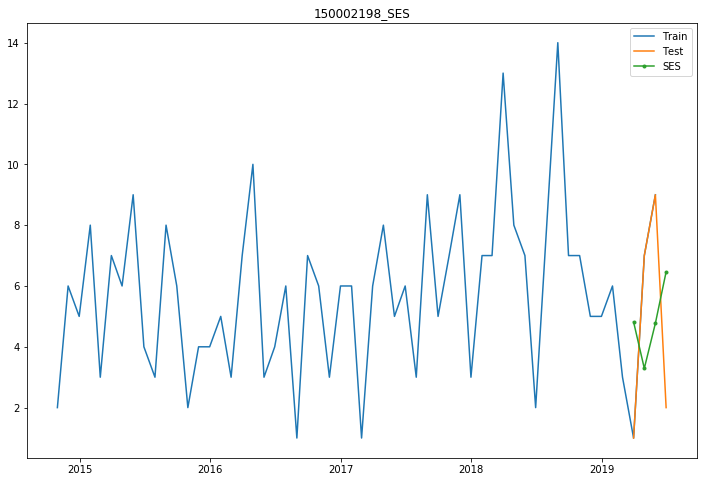

index :  150003747


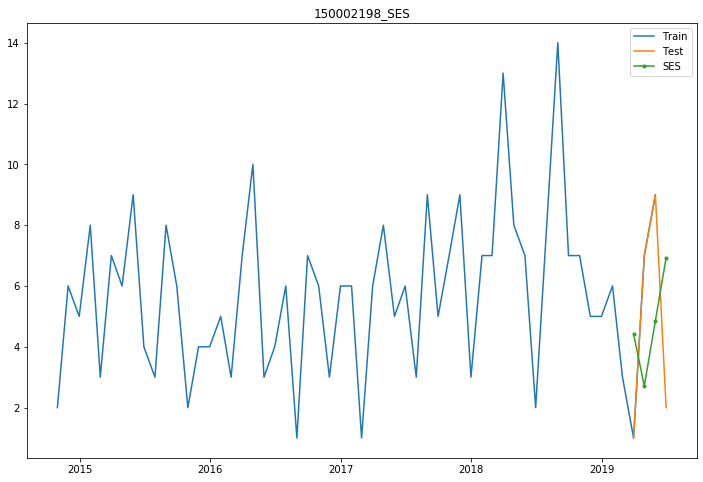

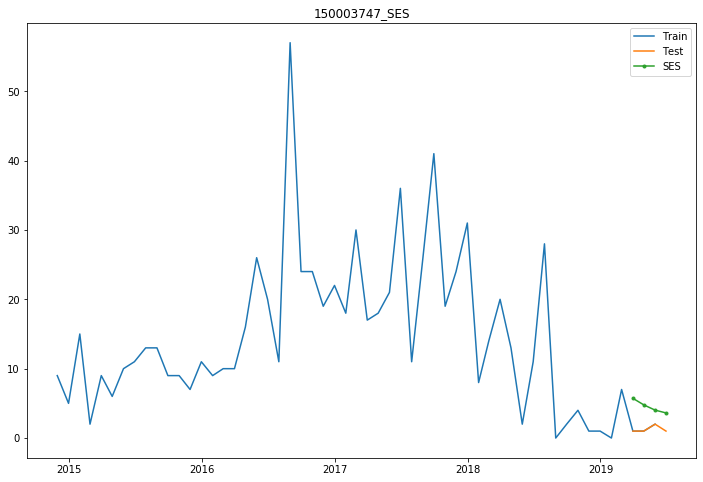

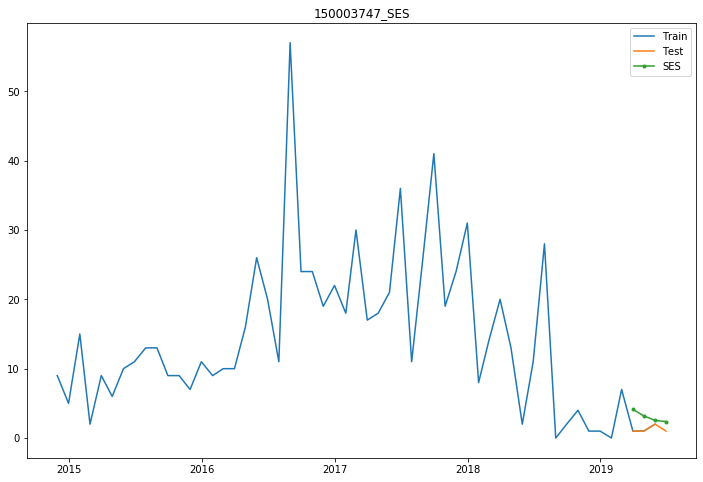

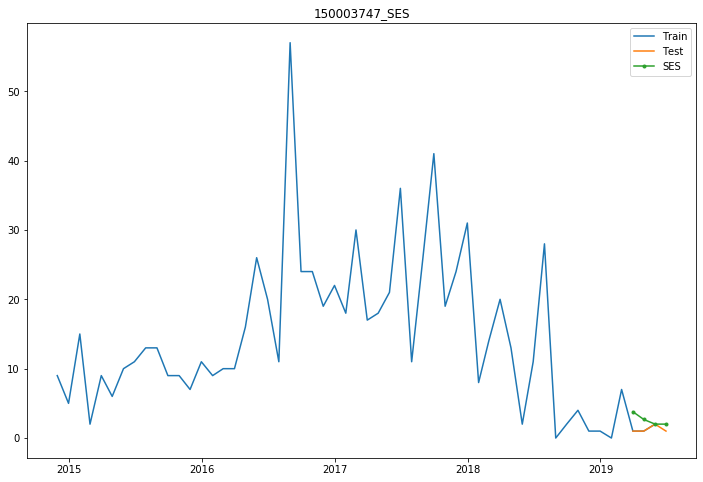

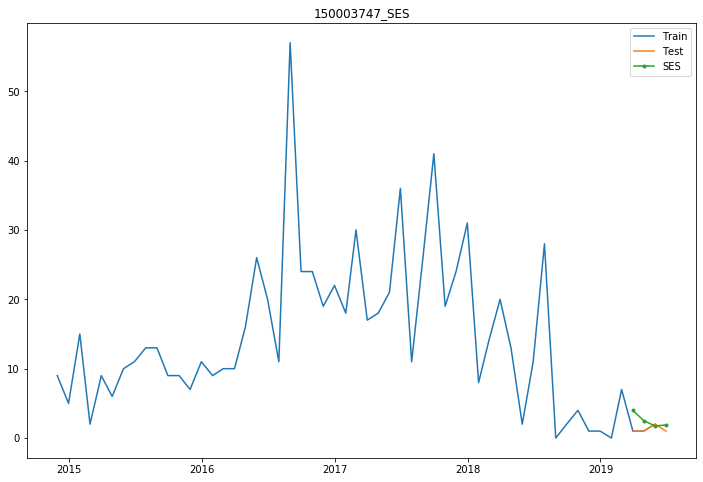

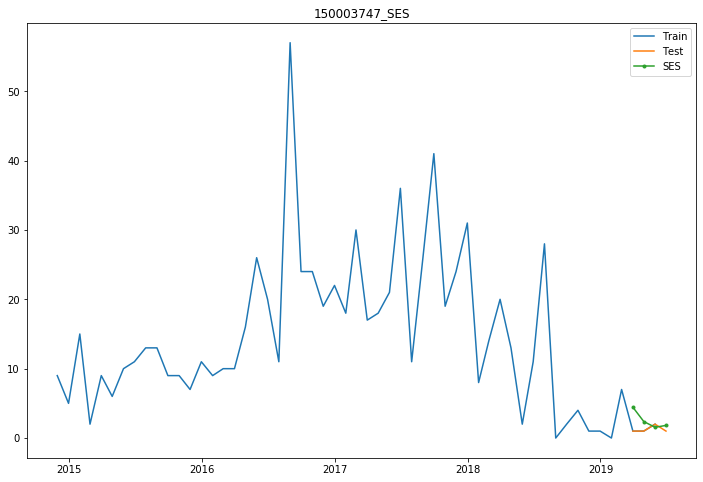

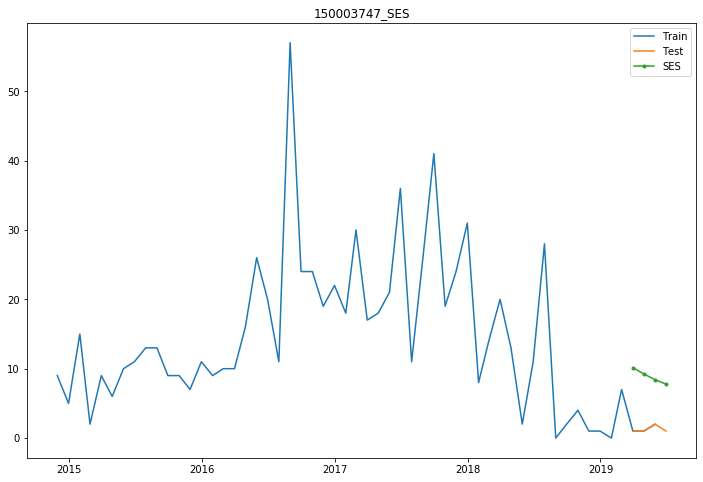

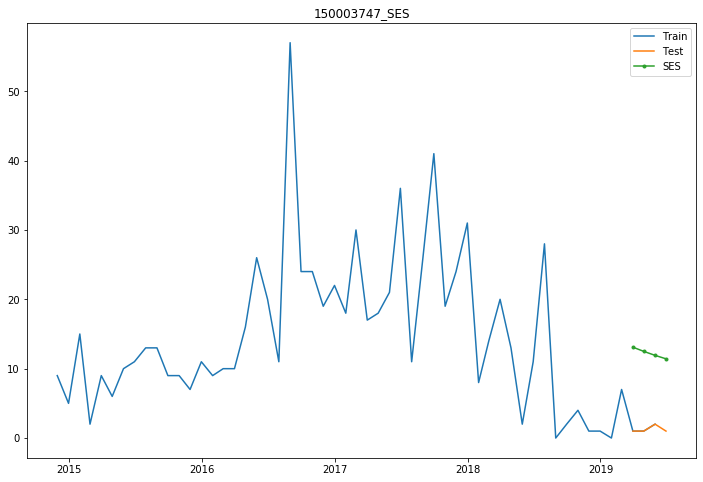

       matnr    011    101    110    111    211    121     112
0  150003747  3.449  2.052  1.705  1.733  1.912  7.723  11.016
index :  150004663


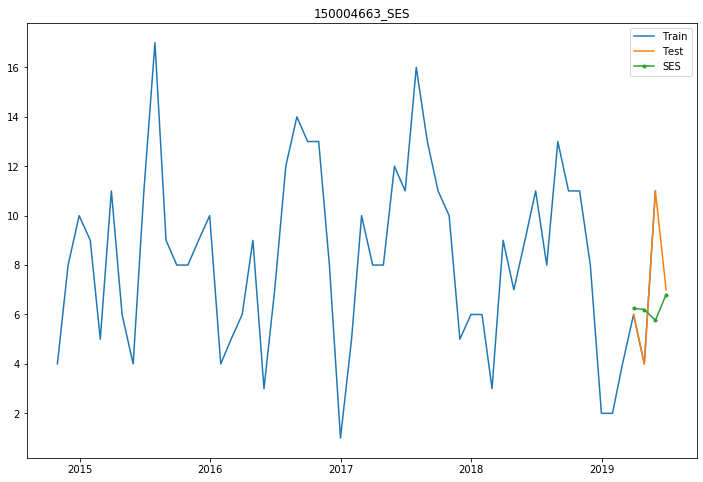

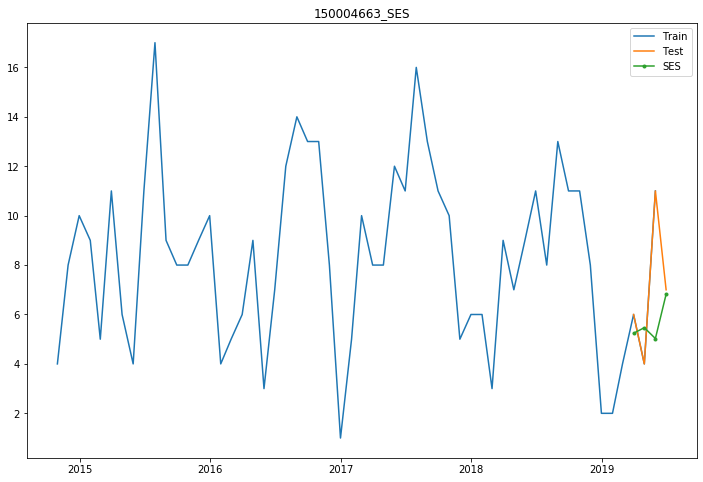

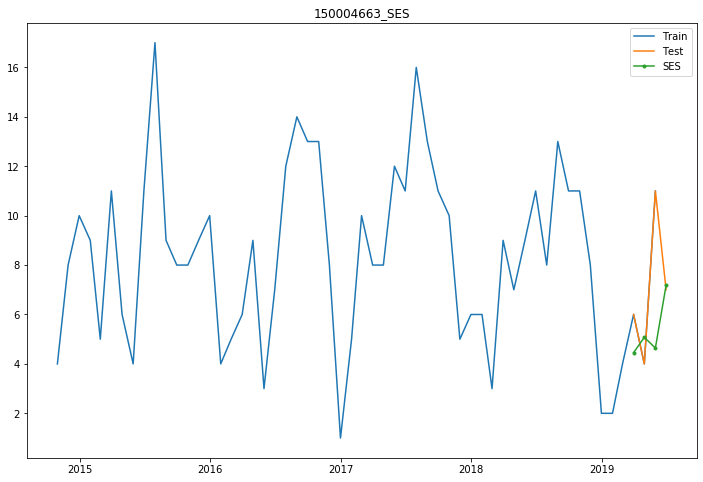

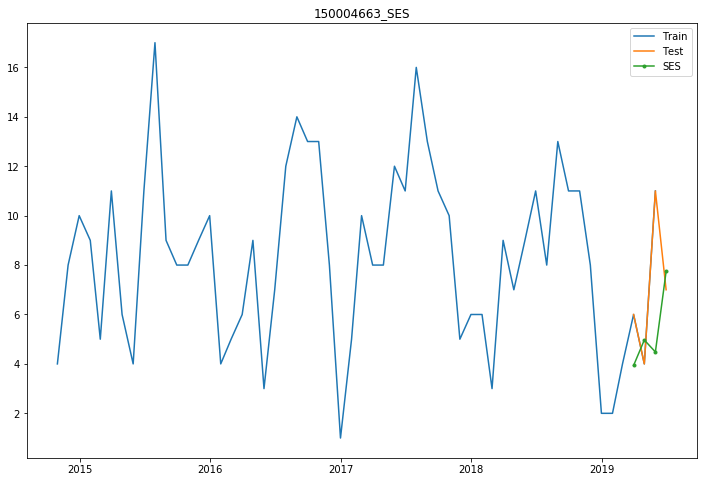

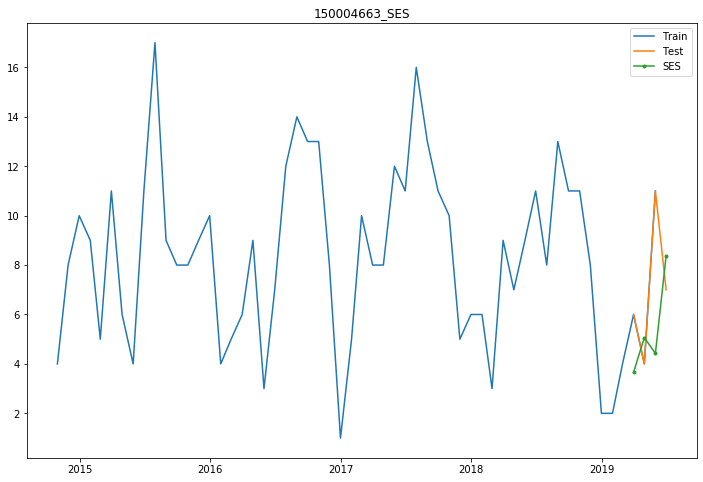

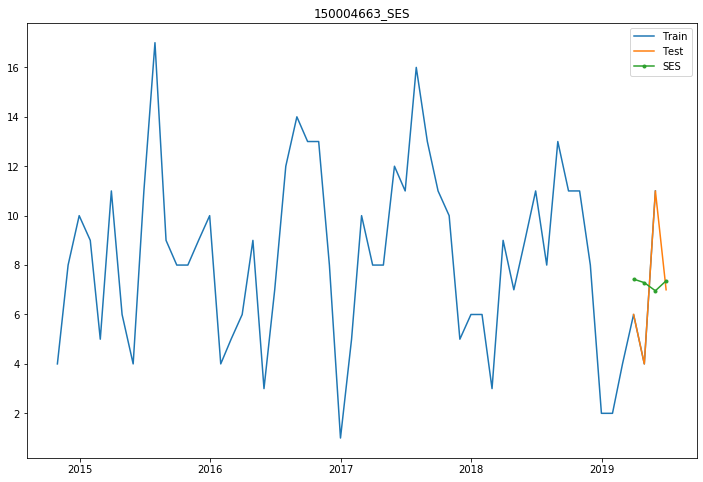

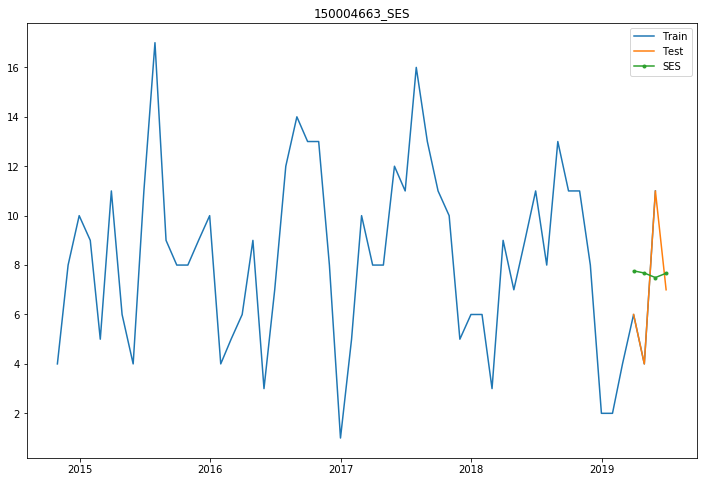

       matnr    011  101    110    111    211    121    112
0  150004663  2.846  3.1  3.315  3.472  3.595  2.707  2.711
index :  150004720


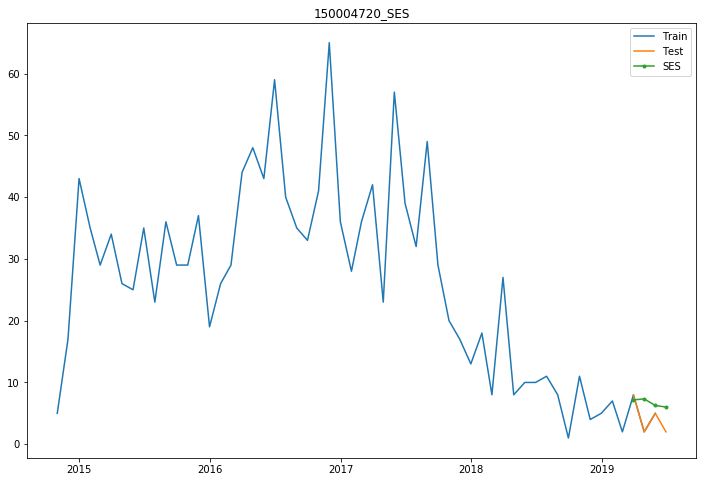

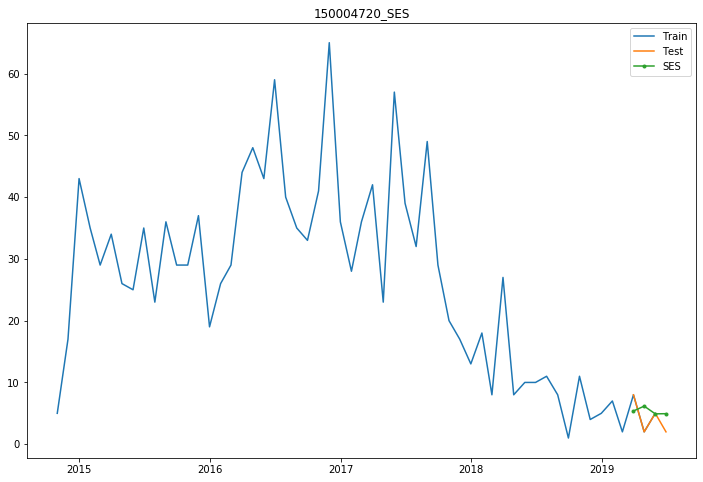

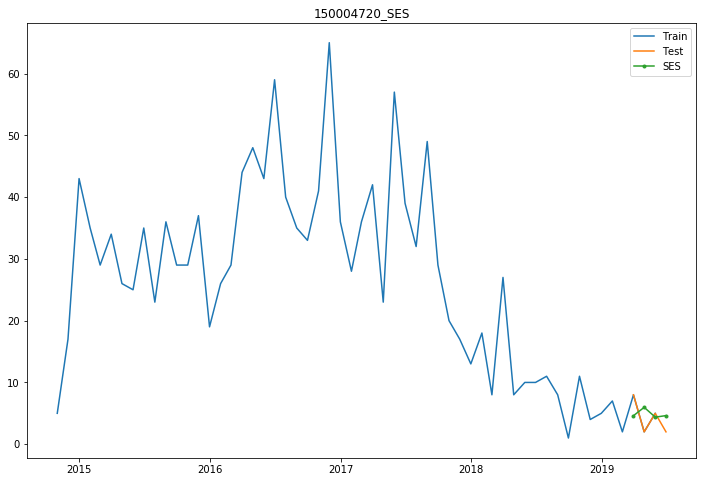

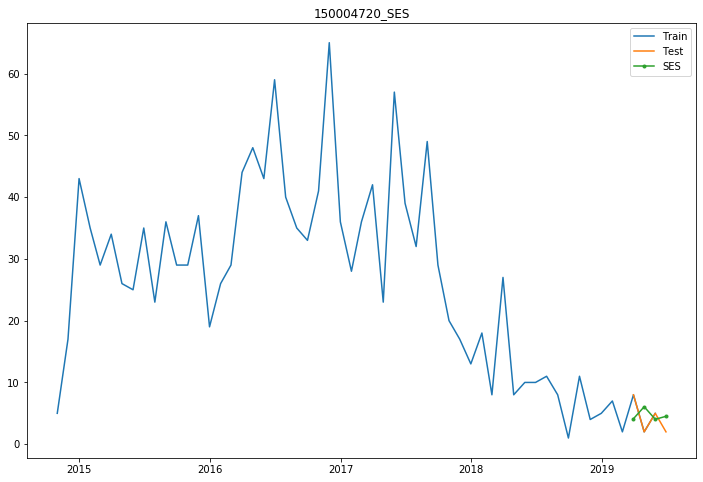

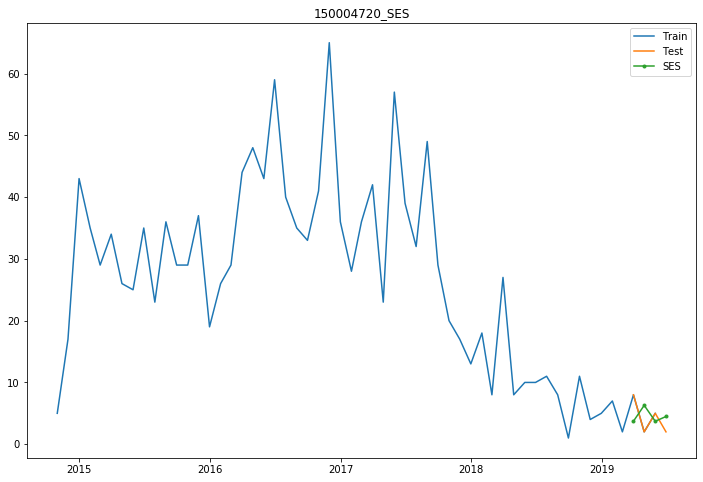

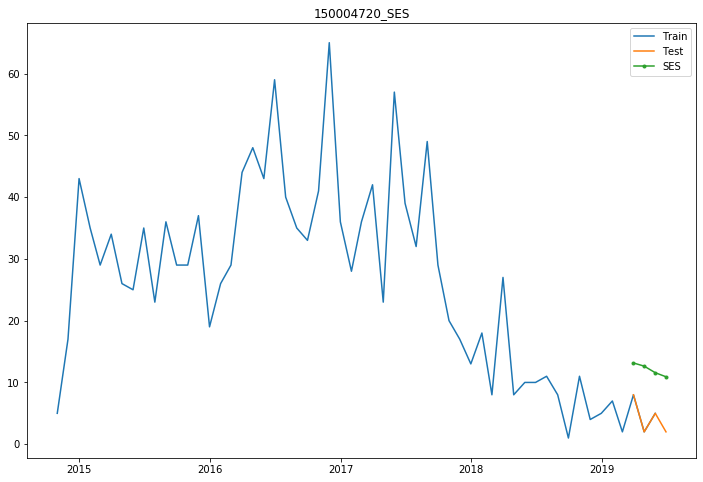

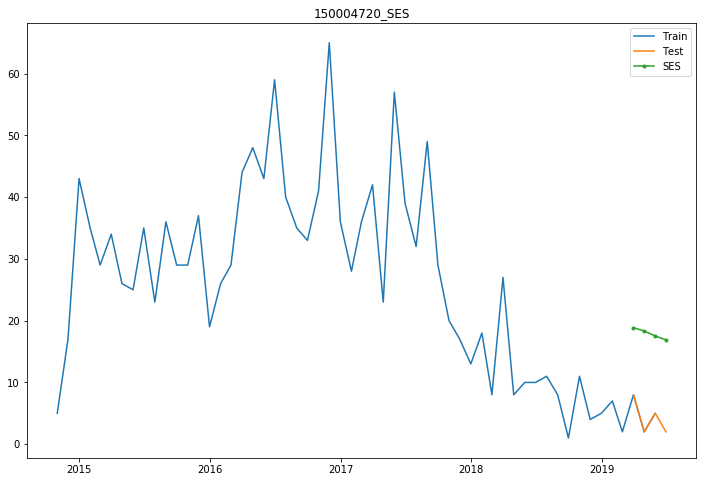

       matnr    011    101    110    111    211  121     112
0  150004720  3.425  2.867  2.937  3.113  3.336  8.1  13.815
index :  150004830


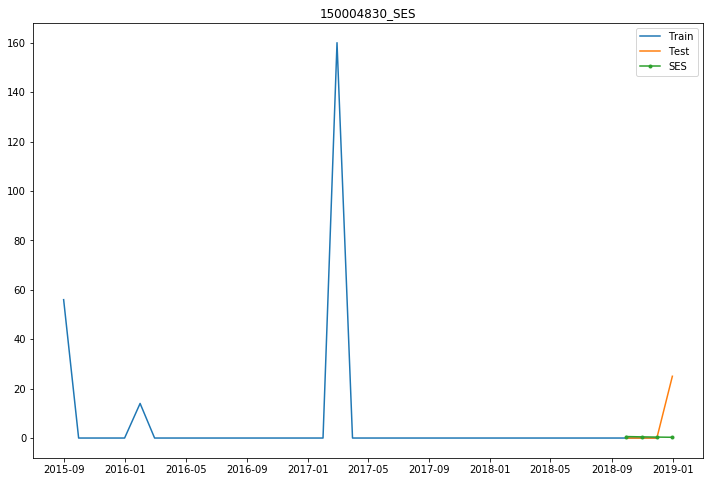

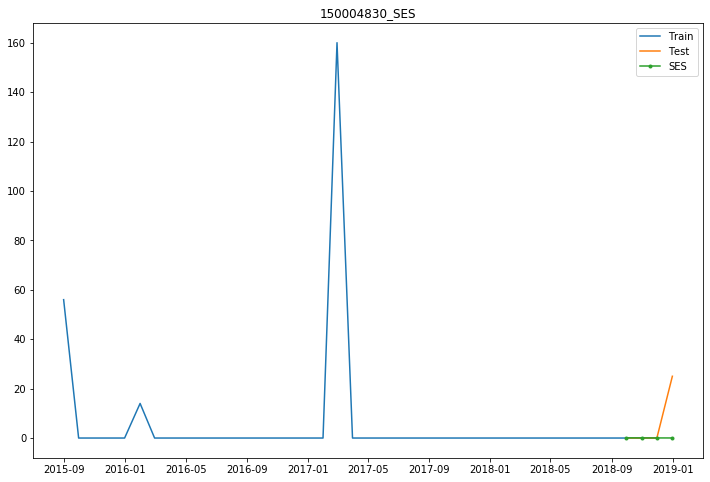

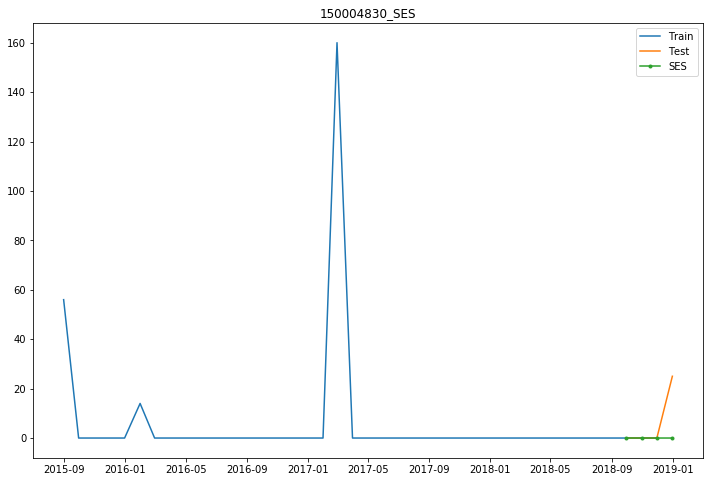

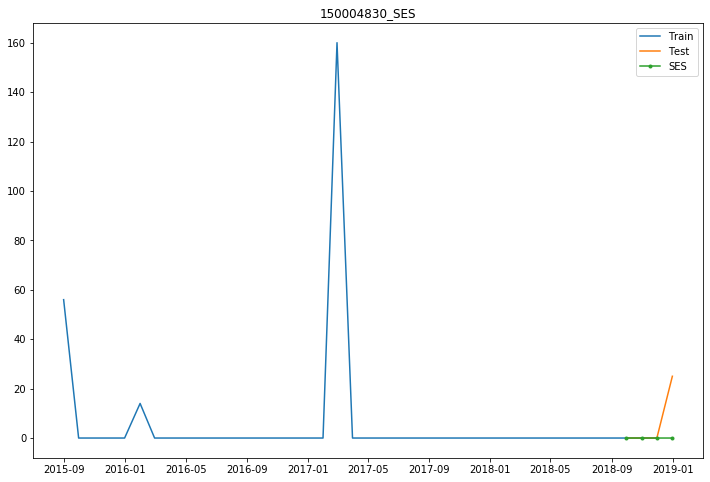

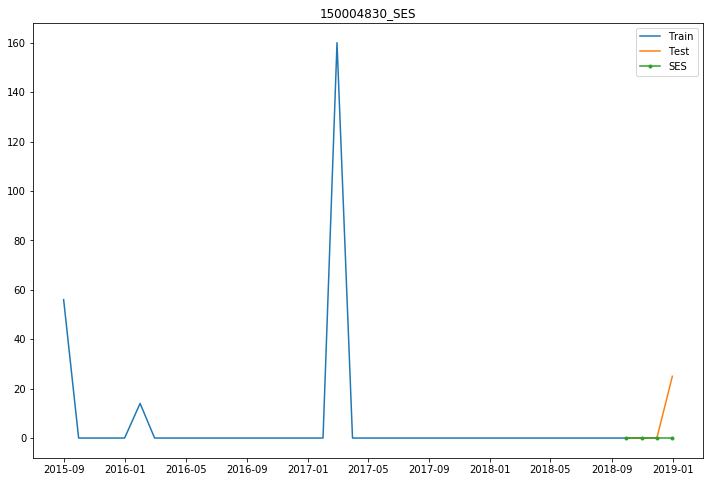

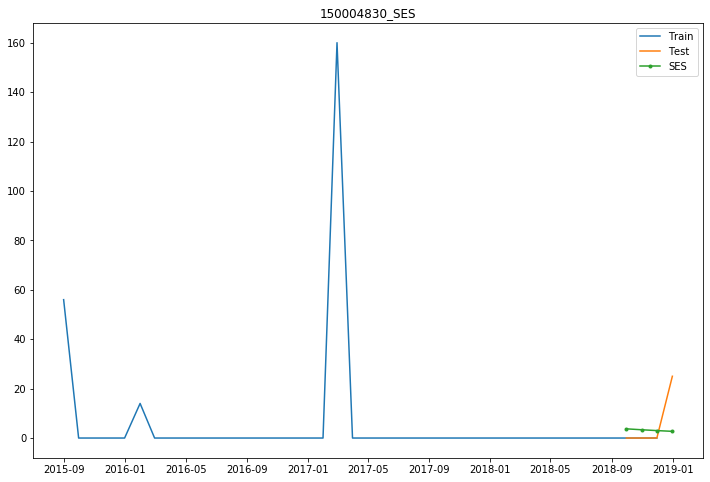

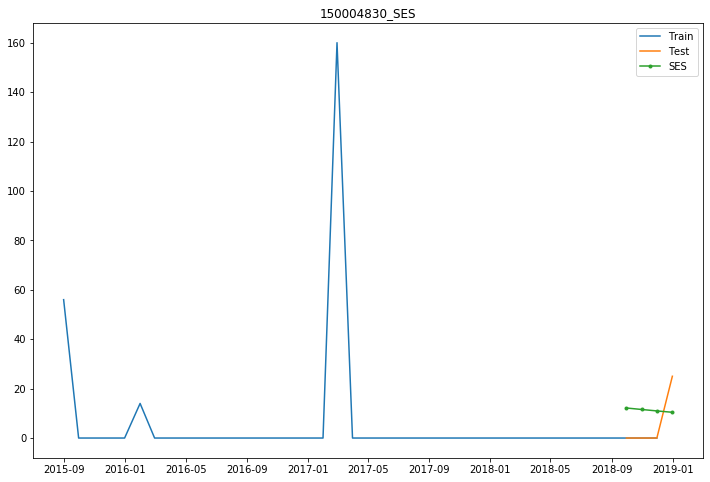

       matnr     011     101     110   111   211     121    112
0  150004830  12.354  12.487  12.499  12.5  12.5  11.521  12.39
index :  150007092


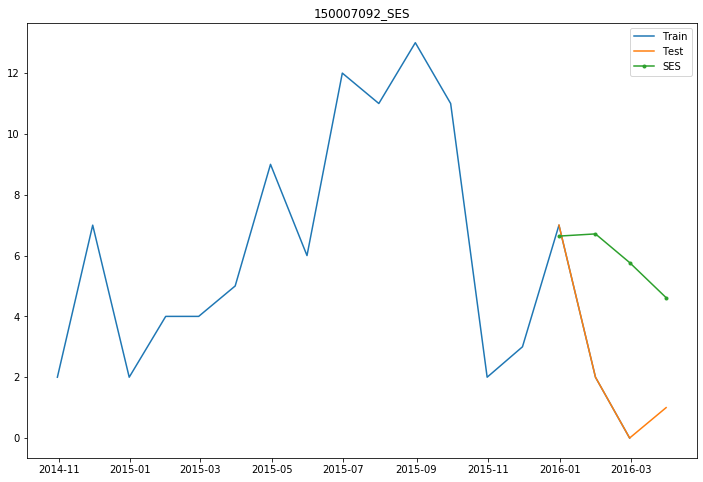

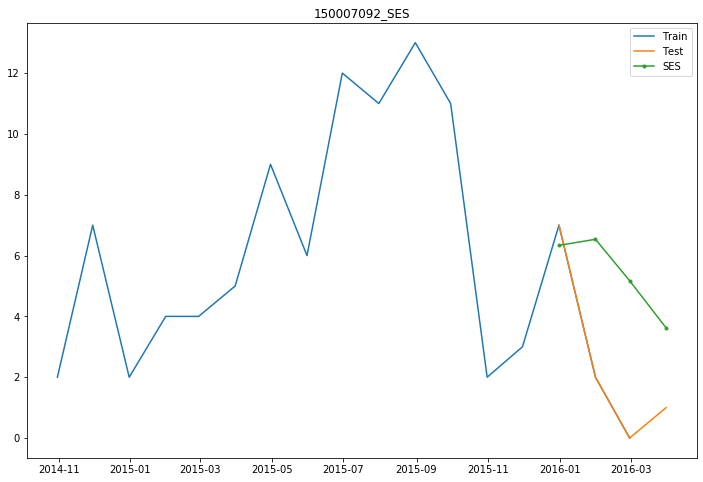

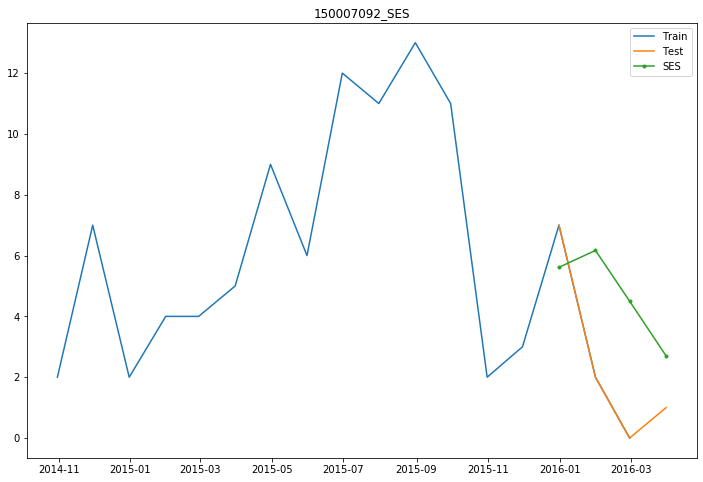

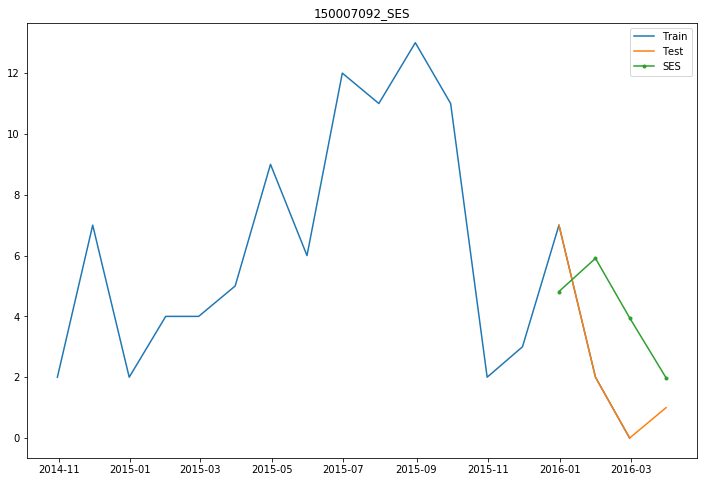

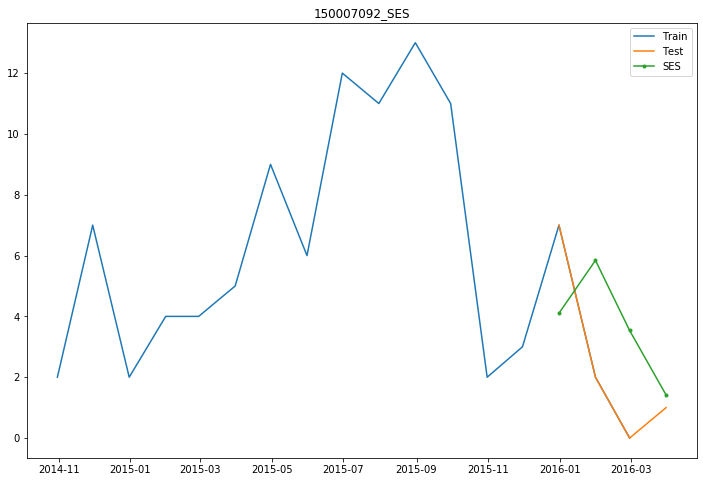

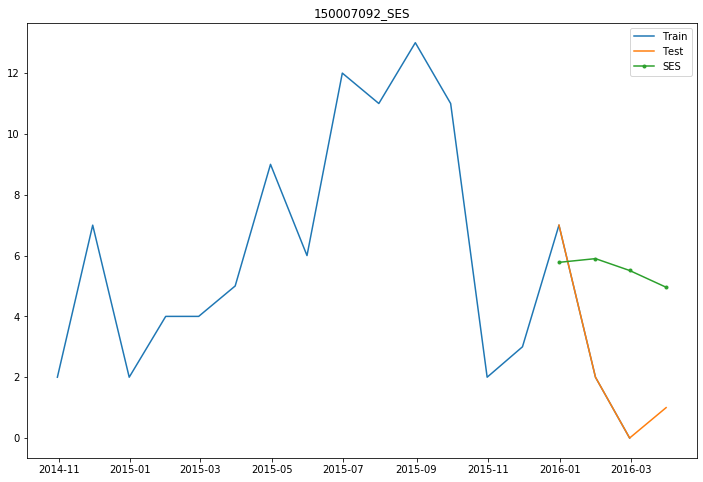

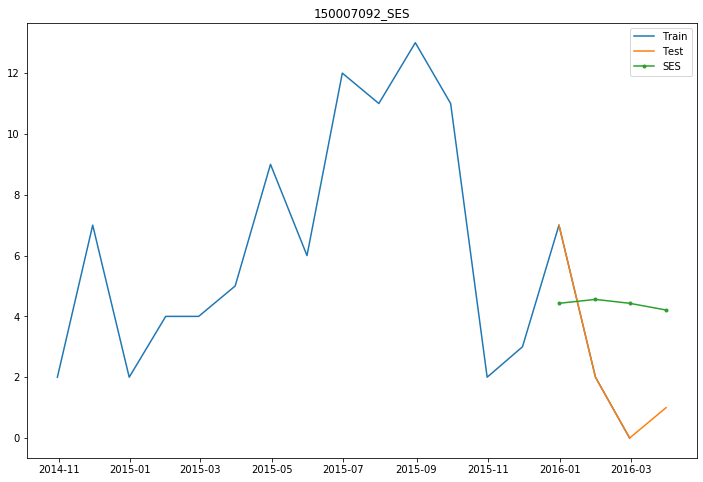

       matnr    011    101    110    111    211   121    112
0  150007092  4.144  3.696  3.258  3.026  2.993  3.96  3.282
index :  150008494


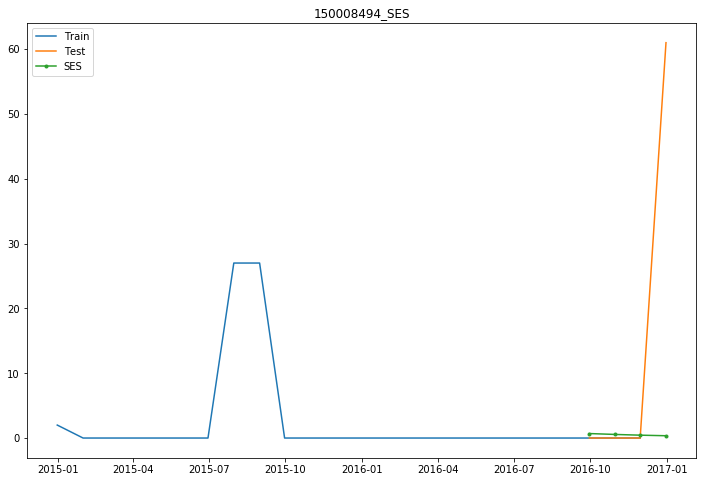

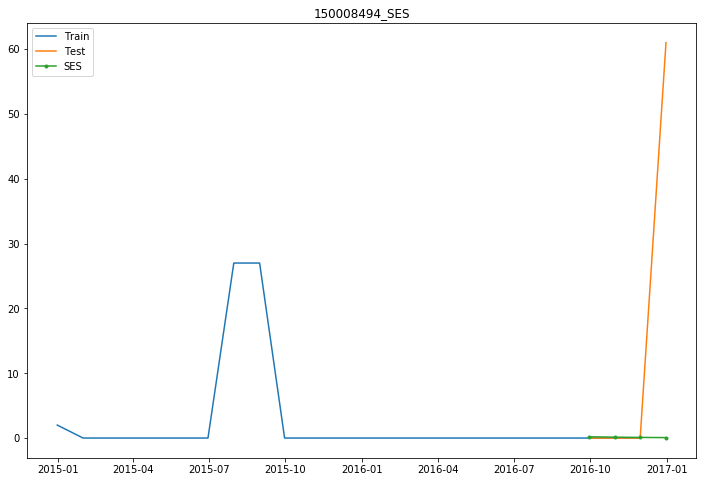

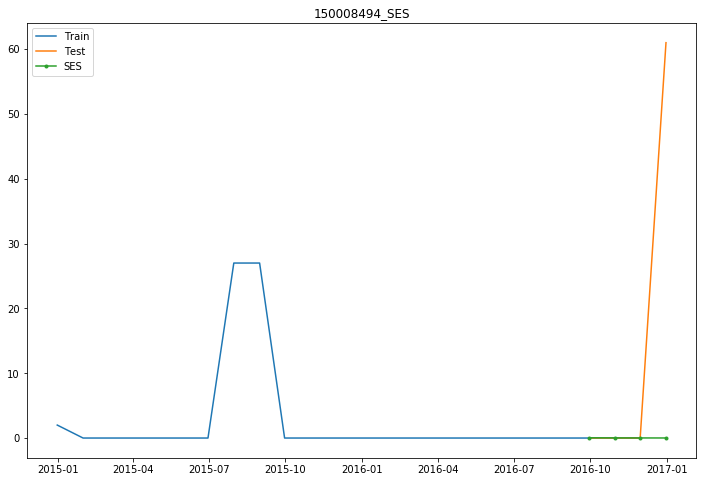

index :  150008943


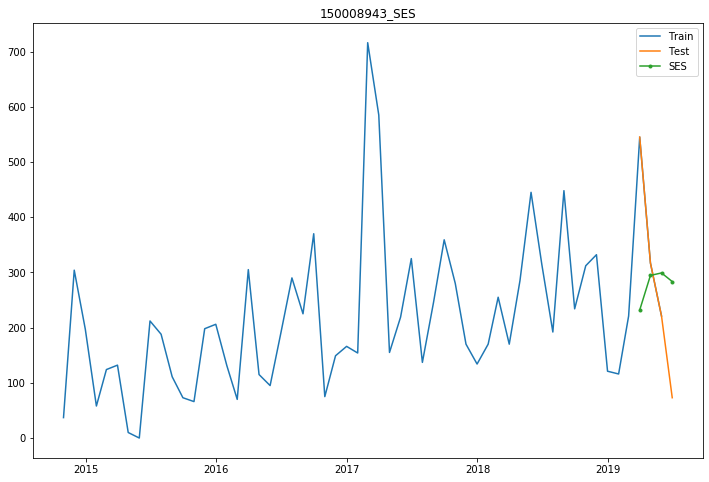

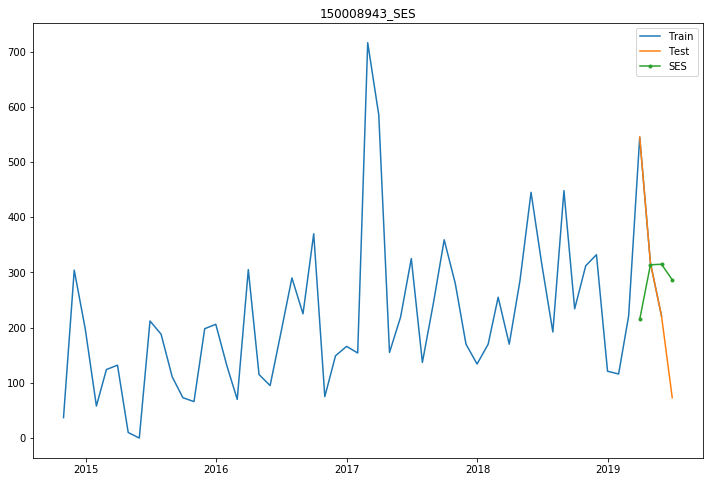

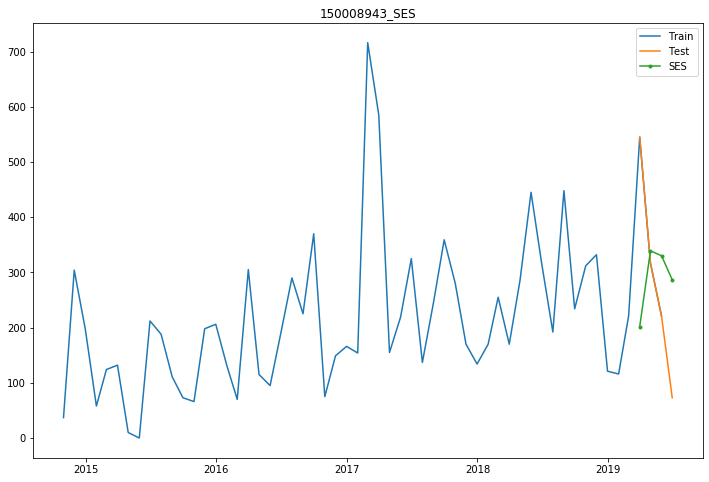

index :  150009920
index :  150009982


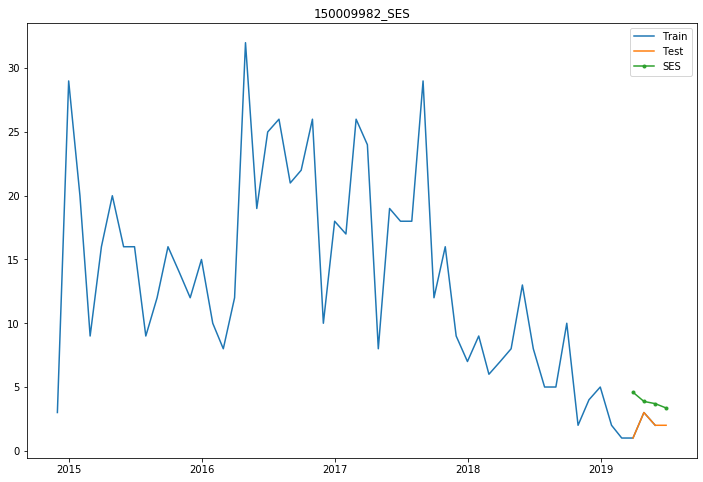

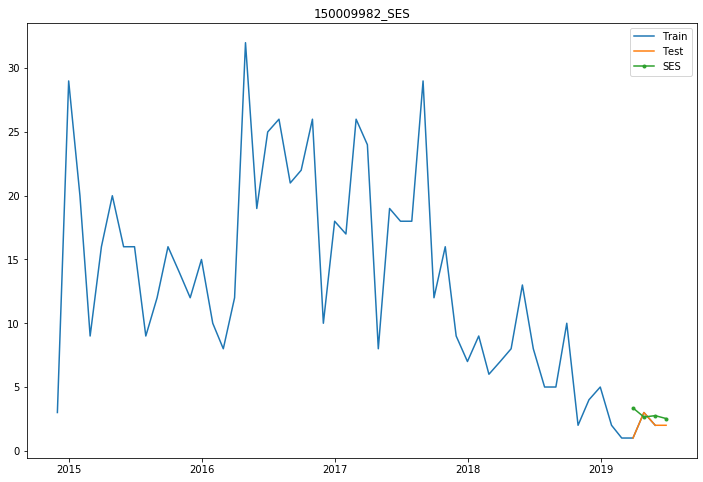

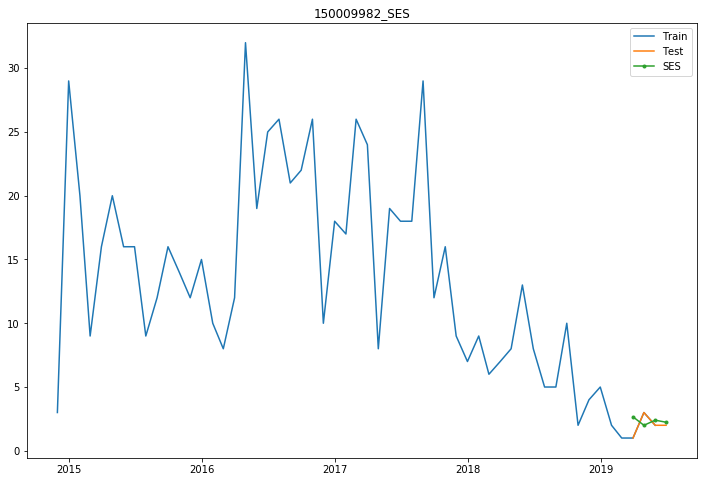

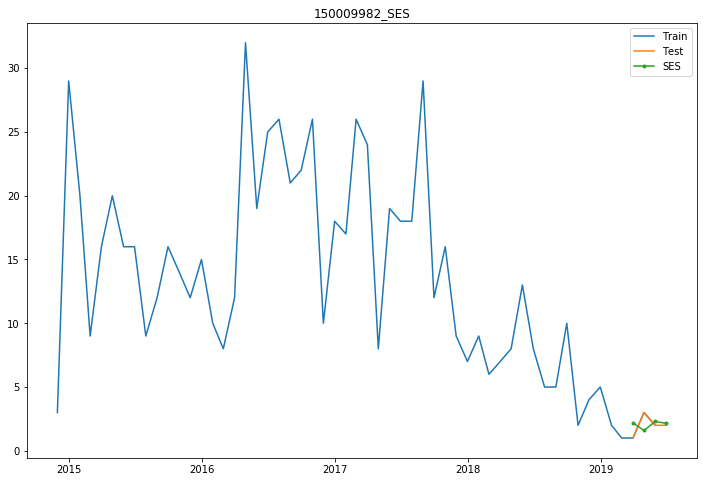

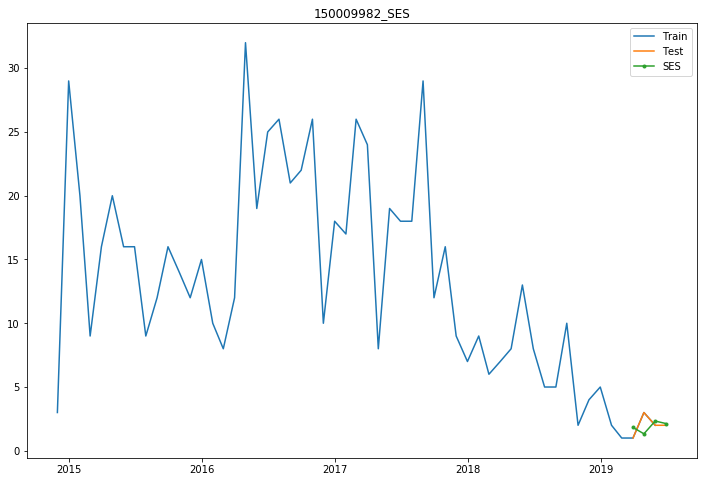

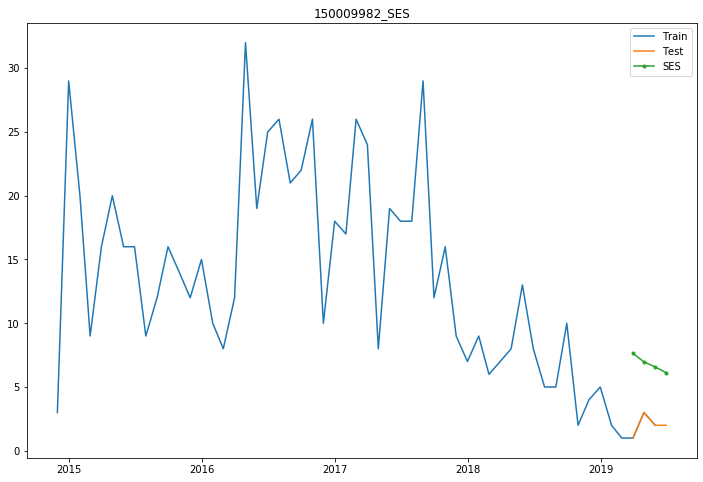

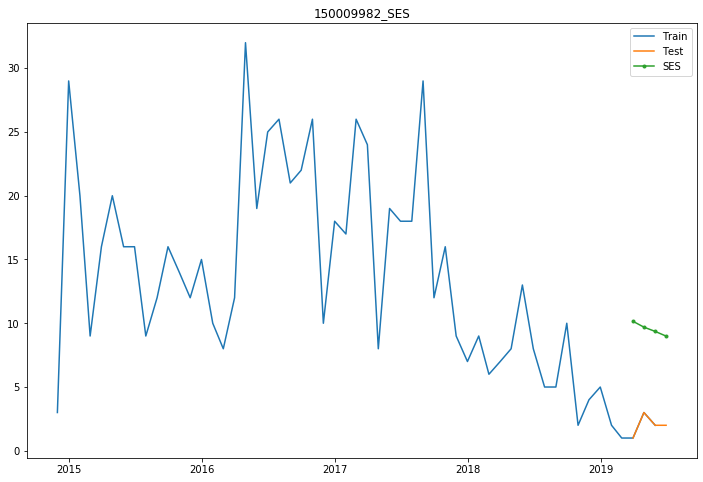

       matnr    011    101    110    111    211    121   112
0  150009982  2.142  1.277  0.999  0.935  0.949  4.942  7.61
index :  150010079


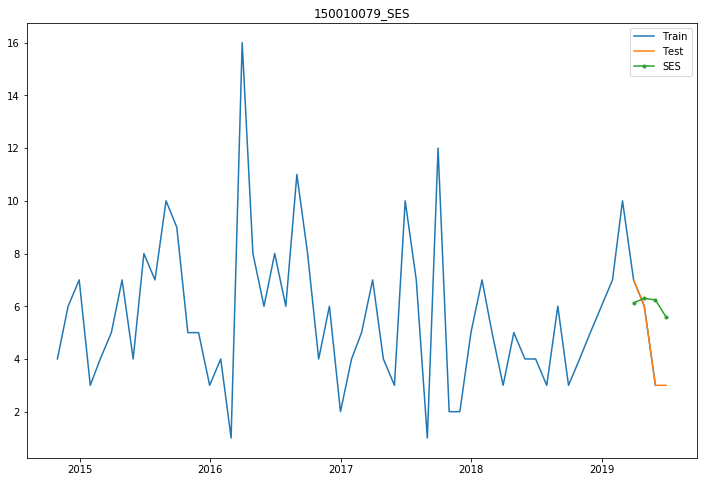

index :  150013771


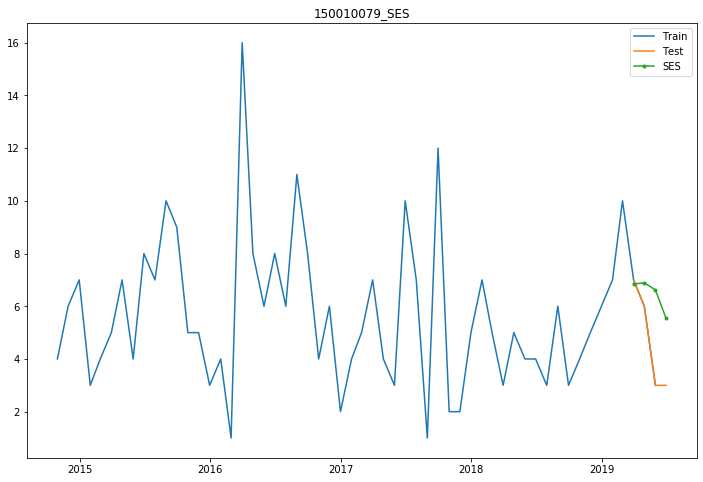

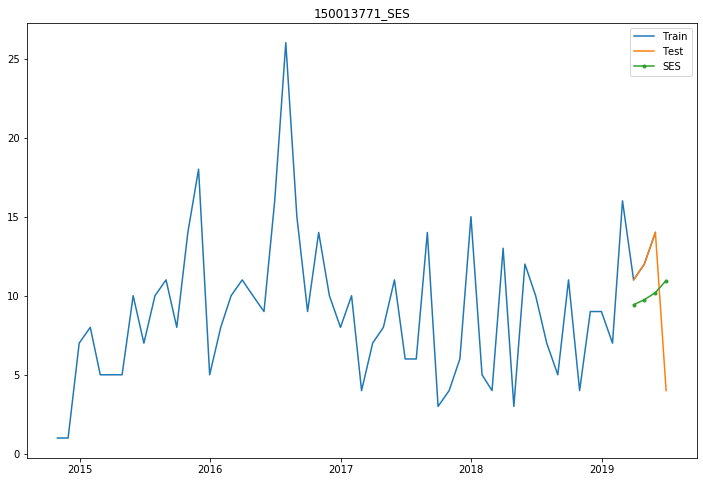

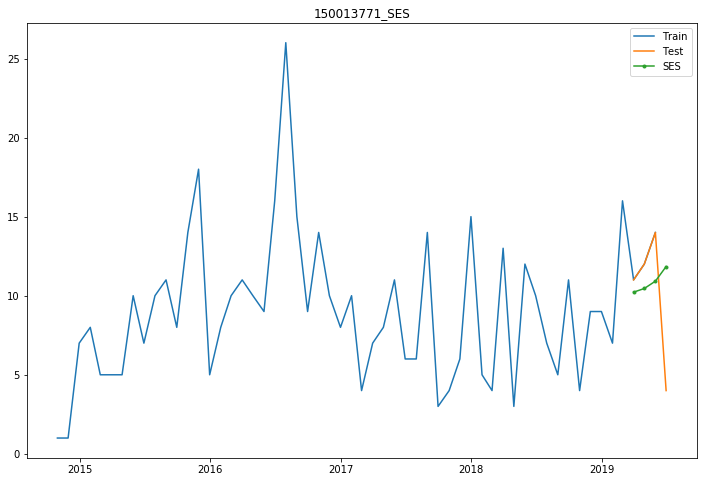

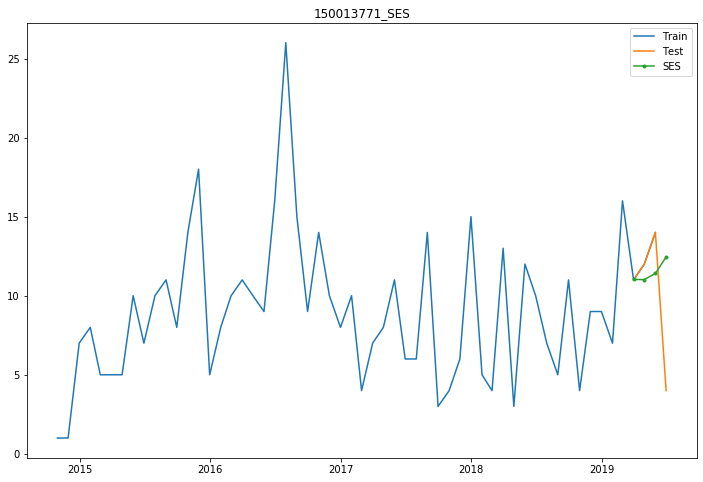

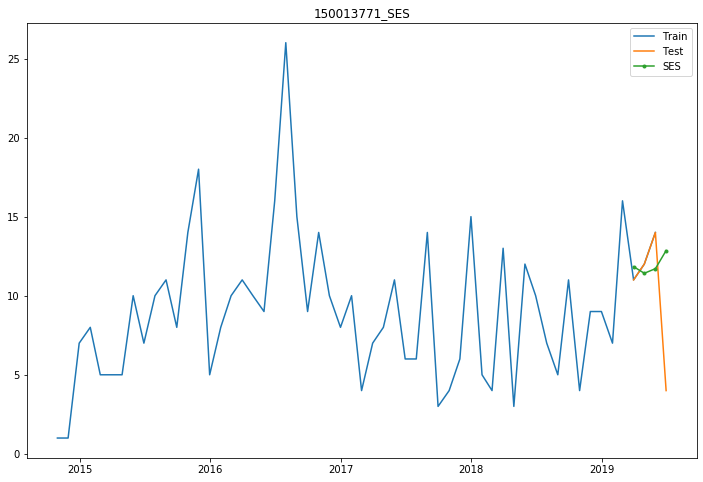

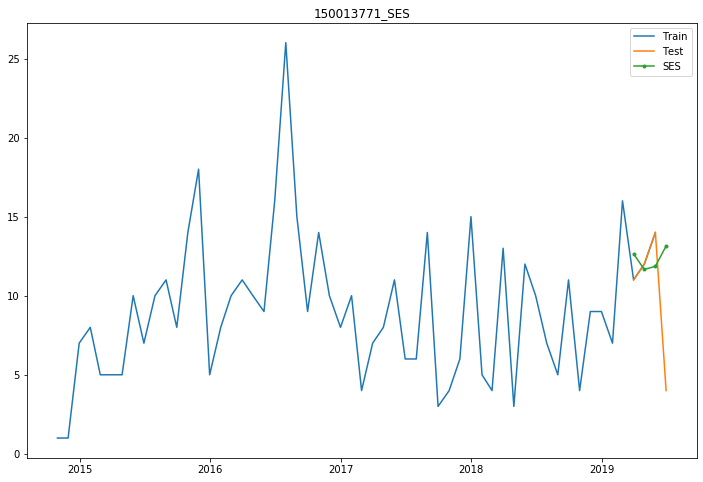

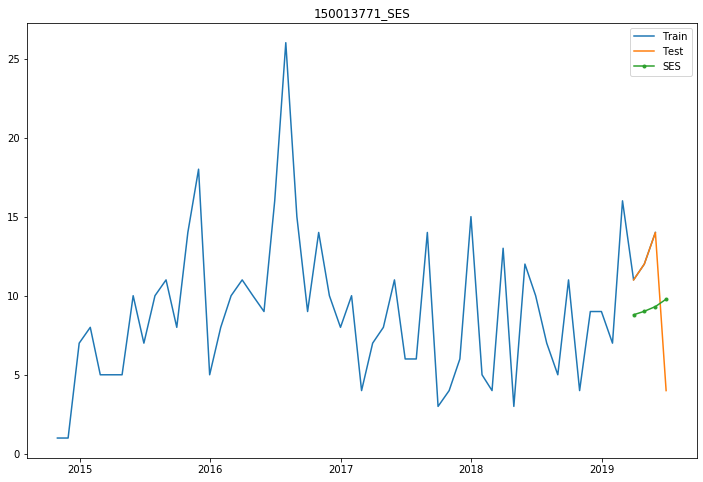

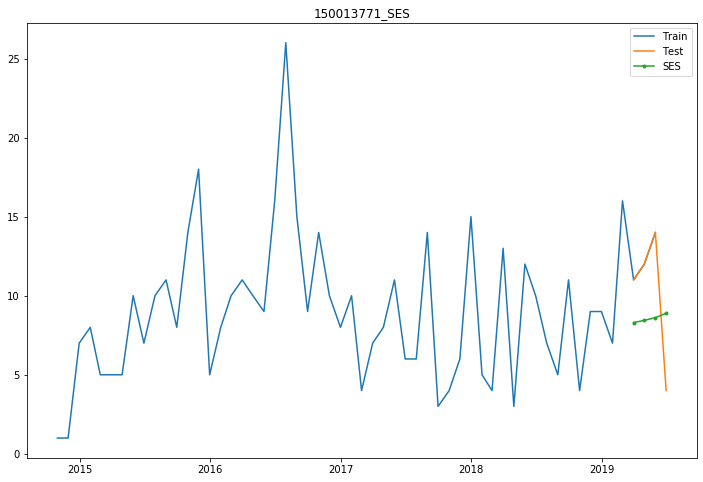

       matnr    011    101    110    111   211    121    112
0  150013771  4.196  4.301  4.444  4.601  4.77  4.159  4.266
index :  150016868
index :  150017824


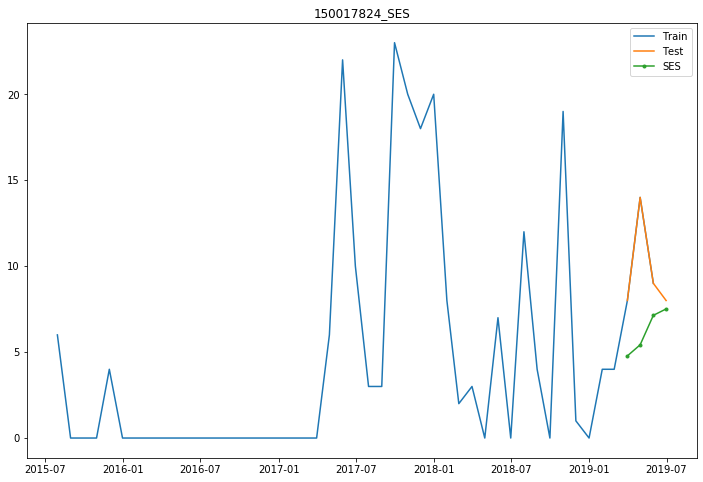

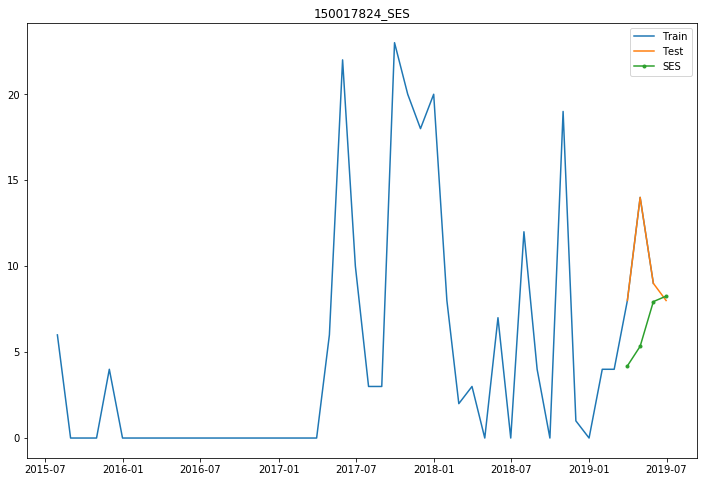

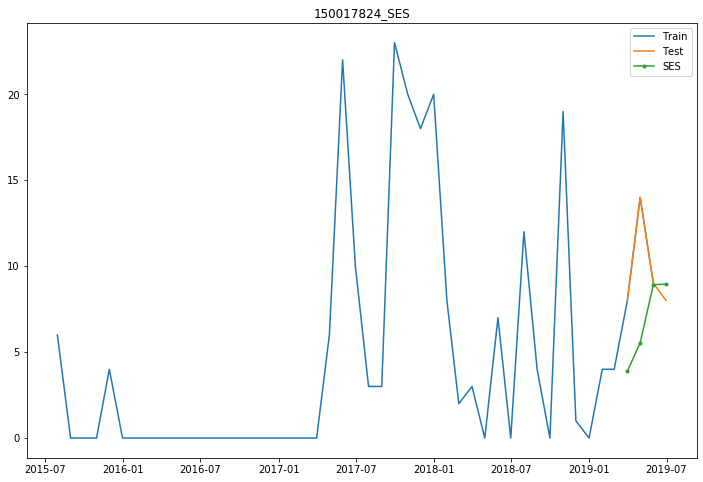

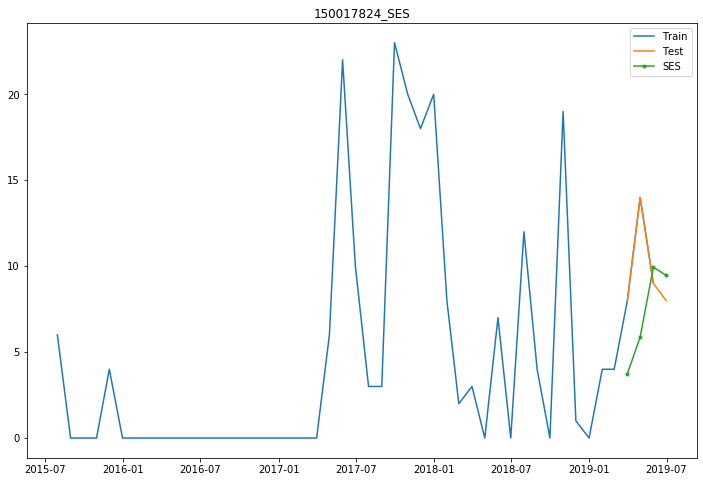

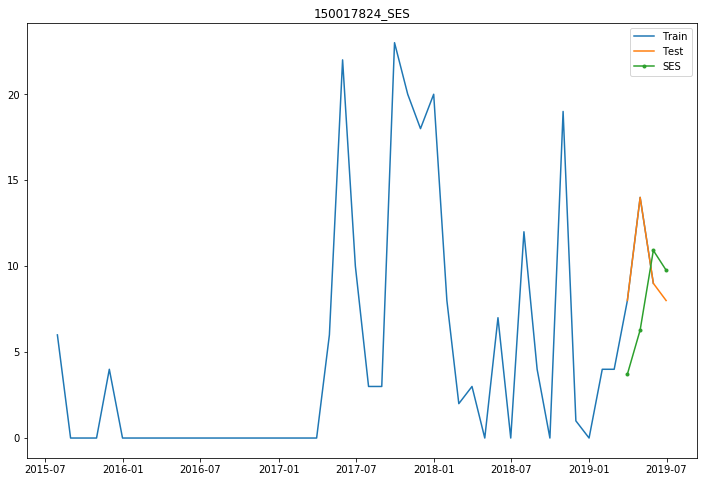

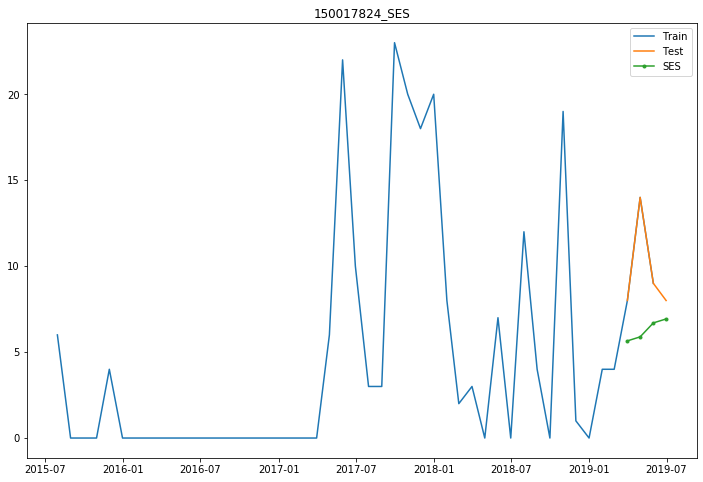

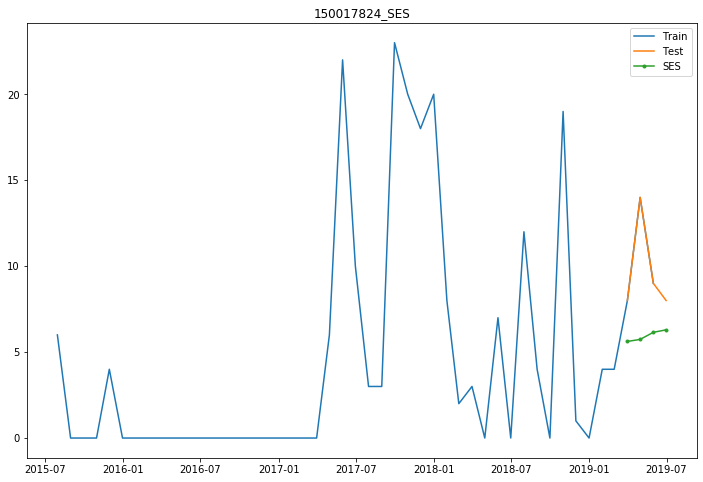

       matnr    011    101    110    111    211   121    112
0  150017824  4.681  4.763  4.728  4.669  4.601  4.41  4.609
index :  150018404


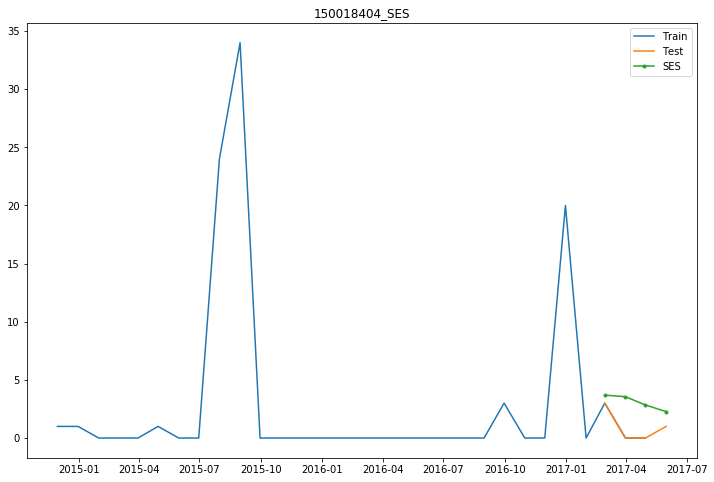

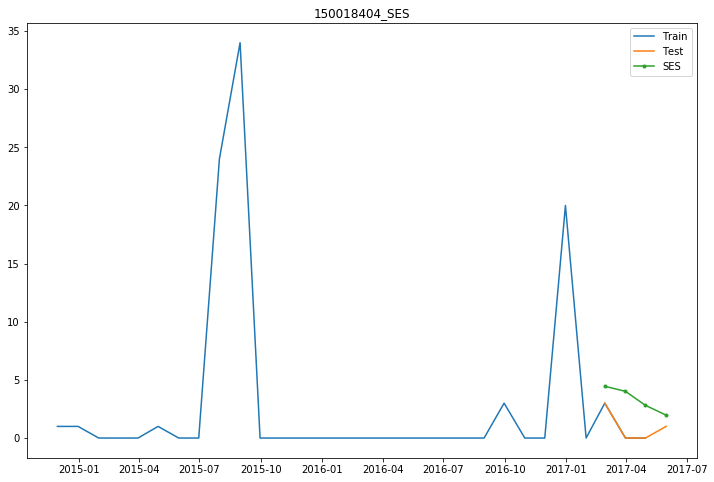

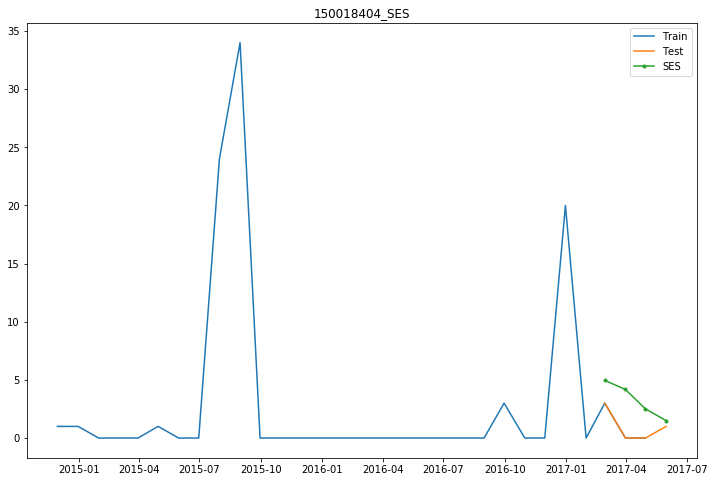

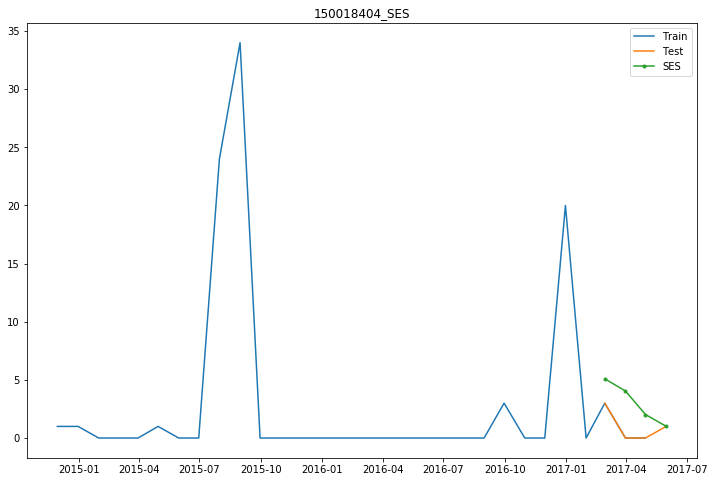

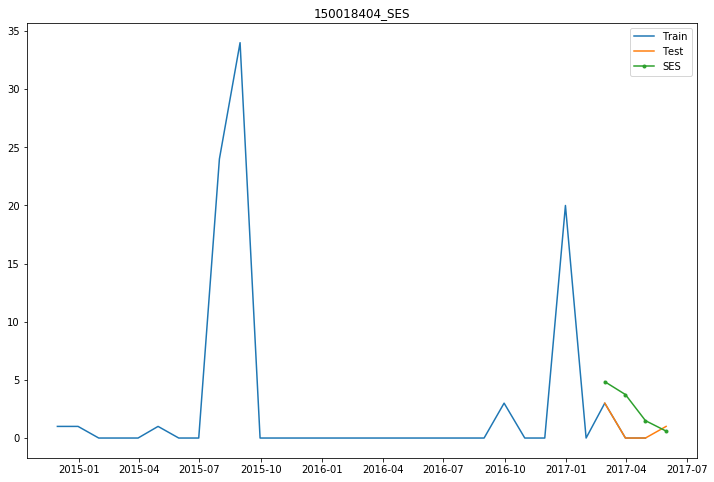

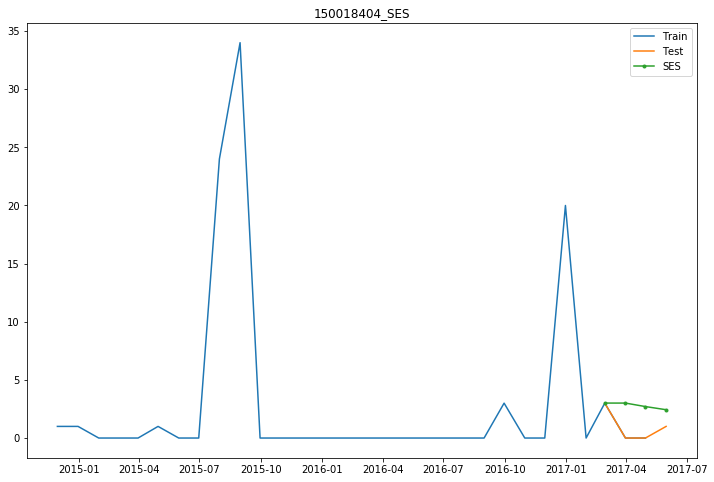

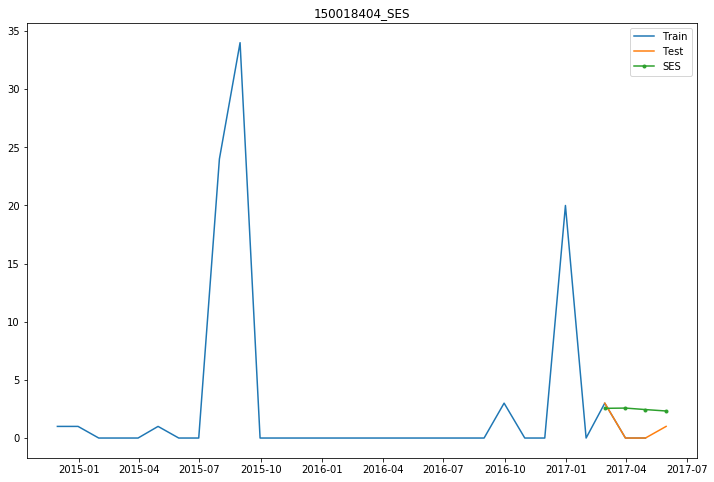

       matnr    011    101    110    111    211    121    112
0  150018404  2.387  2.602  2.636  2.493  2.224  2.146  1.909


In [158]:
columns = "011","101","110","111","121","112","211"
df_res= pd.DataFrame(index=None, columns=columns)
print(df_res)
for i in range (0,20):
            try:
                matnr = high_frequency[i]
                print("index : ",matnr)
                output1,rms1,mae1 = ses(grp_mov,matnr,4,0.2)
                output2,rms2,mae2 = ses(grp_mov,matnr,4,0.3)
                output3,rms3,mae3 = ses(grp_mov,matnr,4,0.4)
                output4,rms4,mae4 = ses(grp_mov,matnr,4,0.5)
                output5,rms5,mae5 = ses(grp_mov,matnr,4,0.6)
                output6,rms6,mae6 = ses(grp_mov,matnr,4,0.1)
                output7,rms7,mae7 = ses(grp_mov,matnr,4,0.05)
                df_res =pd.DataFrame(({"matnr" : [matnr],
                    "011" : [round(rms1,3)],
                    "101" : [round(rms2,3)],
                   "110" : [round(rms3,3)],
                   "111" : [round(rms4,3)],
                   "211" : [round(rms5,3)],
                   "121" : [round(rms6,3)],
                   "112" : [round(rms7,3)]}))
                print(df_res)
                main_df = df_res.append(result_df, ignore_index = True) 
                print(main_df)

#                 print("arima :",rms)
            except :
                pass

In [156]:
main_df

NameError: name 'main_df' is not defined